<center> <img src="https://media.springernature.com/lw685/springer-static/image/chp%3A10.1007%2F978-3-030-39364-9_5/MediaObjects/489541_1_En_5_Fig3_HTML.png" width=50% > </center>

<br><br>

<center> 
    <font size="6">Lab 2: Neighborhood Processing, Low-level Filters & Applications in image processing</font> 
</center>
<center> 
    <font size="4">Computer Vision 1 University of Amsterdam</font> 
</center>
<center> 
    <font size="4">Due 23:59, September 19, 2025 (Amsterdam time)</font> 
</center>
</center>

<br><br>

***

<br><br>

<center>

Student1 ID: 15990834 \
Student1 Name: Vlad Chibulcutean

Student2 ID: 13864149 \
Student2 Name: Jonas Elzinga

Student3 ID: 16235347 \
Student3 Name: May Daniel Ben Zion

( Student4 ID: \
Student4 Name: )

</center>

### **Import Libraries**

In [1]:
import sys

if sys.version_info[0] < 3:
    raise Exception("Python 3 or a more recent version is required.")

In [2]:
# environment and libraries
import os
import math
import numpy as np
import time
import cv2
import matplotlib
import matplotlib.pyplot as plt
import sklearn
import scipy.signal
import pandas as pd
from tqdm import tqdm

from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

In [3]:
# Make sure you're using the provided environment!
assert cv2.__version__ == "4.10.0", "You're not using the provided Python environment!"
assert np.__version__ == "1.26.4", "You're not using the provided Python environment!"
assert matplotlib.__version__ == "3.9.2", "You're not using the provided Python environment!"
# Proceed to the next cell if you don't get any error.

### **Instructions**

Your code and discussion must be handed in this jupyter notebook, renamed to **StudentID1_StudentID2_StudentID3.ipynb** before the deadline by submitting it to the Canvas Lab 2 Assignment. Please also fill out your names and ID's above.

For full credit, make sure your notebook follows these guidelines:
- It is mandatory to **use the Python environment provided** with the assignment; the environment specifies the package versions that have to be used to prevent the use of particular functions. Using different packages versions may lead to grade deduction. In the Python cell above you can check whether your environment is set up correctly.
- To install the environment with the right package versions, use the following command in your terminal: ```conda env create --file=CV1_environment.yaml```, then activate the environment using the command ```conda activate cv1```.
- Do not use additional packages or materials that have not been provided or explicitly mentioned.
- Please express your thoughts **concisely**. The number of words does not necessarily correlate with how well you understand the concepts.
- Answer all given questions and sub-questions.
- Try to understand the problem as much as you can. When answering a question, give evidences (qualitative and/or quantitative results, references to papers, figures etc.) to support your arguments. Note that not everything might be explicitly asked for and you are expected to think about what might strengthen you arguments and make the notebook self-contained and complete.
- Tables and figures must be accompanied by a **brief** description. Do not forget to add a number, a title, and if applicable name and unit of variables in a table, name and unit of axes and legends in a figure.

__Note:__ A more complete overview of the lab requirements can be found in the Course Manual on Canvas

Late submissions are not allowed. Assignments that are submitted after the strict deadline will not be graded. In case of submission conflicts, TAs’ system clock is taken as reference. We strongly recommend submitting well in advance, to avoid last minute system failure issues.

Plagiarism note: Keep in mind that plagiarism (submitted materials which are not your work) is a serious crime and any misconduct shall be punished with the university regulations. This includes the use of generative tools such as ChatGPT.

**ENSURE THAT YOU SAVE ALL RESULTS / ANSWERS ON THE QUESTIONS (EVEN IF YOU RE-USE SOME CODE).**

### **Overview**

- [Section 1: Neighborhood Processing for Image Processing (3 points)](#section-1)
  - [Question 1 (2 points)](#question-1)
  - [Question 2 (1 points)](#question-2)
- [Section 2: Low-Level Gaussian Filters (11 points)](#section-2)
  - [Question 3 (2 points)](#question-3)
  - [Question 4 (3 points)](#question-4)
  - [Question 5 (1 point)](#question-5)
  - [Question 6 (2 points)](#question-6)
  - [Question 7 (1 point)](#question-7)
  - [Question 8 (2 points)](#question-8)
- [Section 3: Low-Level Gabors Filters (15 points)](#section-3)
  - [Question 9 (6 points)](#question-9)
  - [Question 10 (1 point)](#question-10)
  - [Question 11 (1 point)](#question-11)
  - [Question 12 (1 point)](#question-12)
  - [Question 13 (6 points)](#question-13)
- [Section 4: Noise in digital images (27 points)](#section-4)
  - [Question 14 (2 points)](#question-14)
  - [Question 15 (4 points)](#question-15)
  - [Question 16 (1 point)](#question-16)
  - [Question 17 (1 point)](#question-17)
  - [Question 18 (3 points)](#question-18)
  - [Question 19 (2 points)](#question-19)
  - [Question 20 (2 points)](#question-20)
  - [Question 21 (3 points)](#question-21)
  - [Question 22 (2 points)](#question-22)
  - [Question 23 (2 points)](#question-23)
  - [Question 24 (3 points)](#question-24)
  - [Question 25 (2 points)](#question-24)
- [Section 5: Edge Detection (20 points)](#section-5)
  - [Question 26 (4 points)](#question-26)
  - [Question 27 (3 points)](#question-27)
  - [Question 28 (4 point)](#question-28)
  - [Question 29 (1 points)](#question-29)
  - [Question 30 (2 points)](#question-30)
  - [Question 31 (2 points)](#question-31)
  - [Question 32 (2 points)](#question-32)
  - [Question 33 (2 points)](#question-33)
- [Section 6: Foreground-background separation (24 points)](#section-6)
  - [Question 33 (8 points)](#question-33)
  - [Question 34 (8 points)](#question-34)
  - [Question 35 (4 points)](#question-35)
  - [Question 36 (4 points)](#question-36)
- [Section X: Individual Contribution Report (Mandatory)](#section-x)

<a id="section-1"></a>
### **Section 1: Neighborhood Processing for Image Processing**

This assignment will start with an exploration of neighborhood processing techniques, which are fundamental to image processing. These techniques allow for the extraction of structural patterns such as edges and blobs, and are extensively used in tasks like image denoising and segmentation. Neighborhood or block processing is also a key component of Convolutional Neural Networks.

Neighborhood processing involves examining the pixels surrounding a point $I(x, y)$ in an image $I$ and applying a function, $h(k, l)$, that measures specific properties or relationships within that local window. This function, $h(k, l)$, is known as the neighborhood operator or local operator, and is often implemented as a linear filter.

Linear filters compute a weighted sum of the neighboring pixel intensities and assign this sum to the pixel of interest, producing the output $I_{out}(i, j)$. These filters are typically represented as square matrices. Terms like filters, kernels, weight matrices, or masks are often used interchangeably in the literature. A kernel is a matrix that defines a neighborhood operation, such as edge detection or smoothing.

Linear filters are applied across the entire image using operators like correlation ($\otimes$) and convolution ($\ast$).\

Both operators are *linear shift-invariant* (LSI), meaning they function consistently across the image. The discrete forms of these operators are expressed as follows:

- **Correlation (1)**:

$\mathbf{I}_{out} = I \otimes  \mathbf{h} \\
\mathbf{I}_{out}(i,j) = \sum_{k,l}  \mathbf{I}(i+k,j+l) \mathbf{h}(k,l)$

- \\\\**Convolution (2)**:

$\mathbf{I}_{out} = \mathbf{I} \ast  \mathbf{h} \\
\mathbf{I}_{out}(i,j) = \sum_{k,l} \mathbf{I}(i-k,j-l) \mathbf{h}(k,l)$

The following example illustrates neighborhood processing: a kernel or mask convolves over the input image, with each pixel intensity multiplied by the corresponding weight in the kernel. The example uses a $3x3$ averaging mask, showing the effect of filtering on the input image.

<div>
<img src="https://assets.8thlight.com/images/insights/posts/2022-03-25-what-is-a-convolution/padding_example.png" width="700"/>
</div>

<a id="question-1"></a>
#### <font color='#FF0000'>Question 1 (2 points)</font>

What is the difference between correlation and convolution operators? How do they treat the signals $\mathbf{I}$ and $\mathbf{h}$?

##### <font color='yellow'>Answer:</font>

Both **correlation** and **convolution** are **linear** neighborhood operators. The difference between the two is the way the dot product with the kernel is applied.

- **Correlation** measures similarity by sliding the kernel as is

- **Convolution** models the effect of one signal on another by sliding a flipped kernel (Equivalently: rotate h by 180 degrees before sliding.)

**Notes**
- If \(h\) is symmetric, correlation and convolution yield the same result.
- **Convolution** is **commutative** and **associative**; **correlation** is generally **neither**.

<a id="question-2"></a>
#### <font color='#FF0000'>Question 2 (1 point)</font>

Correlation and convolution operators are equivalent when we make an assumption on the form of the mask $\mathbf{h}$. Can you identify the case? Give precise answer here.

##### <font color='yellow'>Answer:</font>

If h is symmetric, the two give the same result; otherwise they differ.


<a id="section-2"></a>
### **Section 2: Low-Level Gaussian Filters**

In this section, you will design common linear filters used in neighborhood processing. We will focus in on Gaussian filters, which are widely used for image smoothing and noise reduction.

<a id="question-3"></a>
#### <font color='#FF0000'>Question 3 (2 points)</font>

The 1D Gaussian filter is defined as follows:

$G_{\sigma}(x)=\frac{1}{\sigma\sqrt{2\pi}}\text{ exp}(-\frac{x^2}{2\sigma^2})$

where $\sigma$ is the standard deviation of the Gaussian. However, such a formulation creates an infinitely large convolution kernel. In practice, the kernel is truncated with a `kernel_size` parameter such that $-\left\lfloor \frac{kernel\_size}{2}\right\rfloor \leq x \leq \left\lfloor \frac{kernel\_size}{2} \right\rfloor$, where $\left\lfloor \cdot \right\rfloor$ is the floor operator. For example, if `kernel_size` equals 3, then $x \in \{ -1, 0, 1 \}$.

Now, implement the following function `gaussian_kernel_1D`.

**Hint:** Do not forget to normalize your filter.

**Note:** You are not allowed to use any Python built-in functions provided by *SciPy* or other libraries to compute the kernel.

In [4]:
def gaussian_kernel_1D(sigma, kernel_size):
    '''
    Computes a 1D Gaussian kernel.

    Args:
        sigma: Standard deviation of the Gaussian distribution.
        kernel_size: The size of the kernel, must be an odd positive integer.

    Returns:
        kernel: A 1D numpy array representing the Gaussian kernel, normalized so that the sum of all elements equals 1.
    '''

    kernel = np.zeros((1, kernel_size))

    if kernel_size % 2 == 0:
        raise ValueError("The kernel size must be an odd number. Otherwise, the kernel will not have a center to convolve around.")

    # find the min and max values for truncation
    min_val = - (kernel_size // 2)
    max_val = kernel_size // 2

    # compute the kernel values within the kernel size
    for i in range(min_val, max_val + 1):
        kernel[0, i + (kernel_size // 2)] = (1 / (sigma * np.sqrt(2 * np.pi))) * np.exp(- (i ** 2) / (2 * sigma ** 2))

    # normalize the kernel to amake sure the sum of all elements equals 1
    kernel = kernel / np.sum(kernel)

    return kernel

In [5]:
G = gaussian_kernel_1D(2, 5)
print(G)

[[0.15246914 0.2218413  0.25137912 0.2218413  0.15246914]]


<a id="question-4"></a>
#### <font color='#FF0000'>Question 4 (3 points)</font>

One of the most important properties of 2D Gaussian kernels is separability. This means that convolving an image with a 2D Gaussian kernel is equivalent to convolving the image twice with a 1D Gaussian filter: once along the x-axis and once along the y-axis, **separately**. A 2D Gaussian kernel can then be defined as the product of two 1D Gaussian kernels:

$G_{\sigma}(x, y) = G_{\sigma}(x) \times G_{\sigma}(y)$ *(Equation A)*

This is mathematically equivalent to:

$G_{\sigma}(x, y) = \frac{1}{\sigma^2 2\pi}\text{ exp}(-\frac{x^2 + y^2}{2\sigma^2})$ *(Equation B)*

Implement the `gaussian_kernel_2D` function that corresponds to *Equation A*. You should make use of the previously implemented `gaussian_kernel_1D` function.

**Note:** You are not allowed to use any Python built-in functions provided by *SciPy* or other libraries to compute the kernel.

In [6]:
def gaussian_kernel_2D(sigma_x, sigma_y, kernel_size):
    '''
    Computes a 2D Gaussian kernel using the separability property.

    Args:
        sigma_x: Standard deviation of the Gaussian distribution along the x-axis.
        sigma_y: Standard deviation of the Gaussian distribution along the y-axis.
        kernel_size: The size of the kernel, must be an odd positive integer.

    Returns:
        kernel_2d: A 2D numpy array representing the Gaussian kernel, normalized so that the sum of all elements equals 1.
    '''

    if kernel_size % 2 == 0:
        raise ValueError("The kernel size must be an odd number. Otherwise, the kernel will not have a center to convolve around.")

    # get the 1D kernels for x and y axes
    kernel_1d_x = gaussian_kernel_1D(sigma_x, kernel_size).flatten()
    kernel_1d_y = gaussian_kernel_1D(sigma_y, kernel_size).flatten()

    # get the dot product of the 1D kernels to create the 2D kernel
    kernel_2d = np.outer(kernel_1d_x, kernel_1d_y)

    # normalize the kernel to make sure the sum of all elements equals 1
    kernel_2d = kernel_2d / np.sum(kernel_2d)

    return kernel_2d

In [7]:
G = gaussian_kernel_2D(2, 2, 3)
print(G)

[[0.10186806 0.11543164 0.10186806]
 [0.11543164 0.13080118 0.11543164]
 [0.10186806 0.11543164 0.10186806]]


<a id="question-5"></a>
#### <font color='#FF0000'>Question 5 (1 point)</font>

Consider the following two scenarios:

1. An image is convolved with a 2D Gaussian kernel.
2. The same image is convolved first with a 1D Gaussian kernel along the x-axis and then with a 1D Gaussian kernel along the y-axis.

Will these two scenarios produce the same result? Explain your answer.

##### <font color='yellow'>Answer:</font>

>As was just introduced in Question 4: "One of the most important properties of 2D Gaussian kernels is separability. This means that convolving an image with a 2D Gaussian kernel is equivalent to convolving the image twice with a 1D Gaussian filter: once along the x-axis and once along the y-axis, **separately**". Just with this information, we can say that the two scenarios just introduced will indeed produce the same results, because of the separability property of the 2D Gaussian kernel.

<a id="question-6"></a>
#### <font color='#FF0000'>Question 6 (2 points)</font>

What is the computational complexity for both scenarios described in Question 5? Provide your answer in Big O notation, using *n* for the width of the image, *m* for the height of the image, and *k* for the size of the kernel.

##### <font color='yellow'>Answer:</font>

>For the first scenario, we have a complete image with the size n\*m. Each pixel in that n\*m image has to be multiplied by the kernel, which is 2D, and has the size k\*k. This means that, in big O notation, the complexity for using scenario 2 is: O(n\*m\*k\*k) = O(n\*m\*k^2)<br>
>For the second scenario there are two seperate pases, first over the x-axis of the complete n\*m image with a k-sized kernel, and then over the y-axis of the n*m image with a k-sized kernel. In big O notation, that would give: O(n\*m\*k) + O(n\*m\*k) = 2\*O(n\*m\*k), and because we ignore constants in the big O notation, the final notation is O(n\*m\*k).<br>
>Looking at this, it can be seen that the second scenario, of using the 2 1D kernels seperate, is faster then using the 2D kernel by itself.

<a id="question-7"></a>
#### <font color='#FF0000'>Question 7 (1 point)</font>

So far, the Gaussian kernels that we have computed are primarily used for image enhancement tasks, such as denoising. However, these kernels can also be used to detect changes in image intensity, which are crucial for identifying low-level features. These features can then serve as building blocks for more complex tasks like object detection or segmentation.

The first-order derivative of the 1D Gaussian kernel is given by:

$\frac{d}{dx}G_\sigma(x)  =\frac{d}{dx}\left( \frac{1}{\sigma\sqrt{2\pi}}\exp\left(-\frac{x^2}{2\sigma^2}\right) \right)$

$ = -\frac{x}{\sigma^3\sqrt{2\pi}}\exp\left(-\frac{x^2}{2\sigma^2}\right)$ *(Eq. C)*

$ = -\frac{x}{\sigma^2}G_\sigma(x)$

Similarly, the first-order derivative of the 2D Gaussian kernel can be obtained by computing $\frac{d}{dx}G_\sigma(x,y)$ and $\frac{d}{dy}G_\sigma(x,y)$.

Determine the first-order derivative of the 2D Gaussian kernel by computing $\frac{d}{dx}G_\sigma(x,y)$ and $\frac{d}{dy}G_\sigma(x,y)$.

Show your calculations, as done above for $\frac{d}{dx}G_\sigma(x)$.

Remember that:

$G_{\sigma}(x, y) =\frac{1}{\sigma^2 2\pi}\exp\left(-\frac{x^2 + y^2}{2\sigma^2}\right)$

##### <font color='yellow'>Answer:</font>

>So, we know the formula for the 2D Gaussian kernel is $G_{\sigma}(x, y) =\frac{1}{\sigma^2 2\pi}\exp\left(-\frac{x^2 + y^2}{2\sigma^2}\right)$, and we have to take the derivative with respect to x, and the derivative with respect to y. Lets first do to x:<br>
$\frac{\partial}{\partial x}G_{\sigma}(x, y) =\frac{\partial}{\partial x}\frac{1}{\sigma^2 2\pi}\exp\left(-\frac{x^2 + y^2}{2\sigma^2}\right)$<br>
We can see that $\frac{1}{\sigma^2 2\pi}$ is a constant, so we only have to take into account the second part for the derivative:<br>
$\frac{\partial}{\partial x}\exp\left(-\frac{x^2 + y^2}{2\sigma^2}\right) = \exp\left(-\frac{x^2 + y^2}{2\sigma^2}\right)\frac{\partial}{\partial x}\left(-\frac{x^2 + y^2}{2\sigma^2}\right) = \exp\left(-\frac{x^2 + y^2}{2\sigma^2}\right)\frac{\partial}{\partial x}\left(-\frac{2x}{2\sigma^2}\right) = \left(-\frac{x}{\sigma^2}\right)\exp\left(-\frac{x^2 + y^2}{2\sigma^2}\right)$<br>
Putting back the constant gives:<br>
$\left(-\frac{x}{\sigma^2}\right) * \frac{1}{\sigma^2 2\pi}\exp\left(-\frac{x^2 + y^2}{2\sigma^2}\right)$<br>
Where the last part is just the 2D Gaussian kernel again, giving:<br>
$\left(-\frac{x}{\sigma^2}\right) * G_\sigma(x,y)$<br>
>
>Now doing the derivative with respect to y $\frac{\partial}{\partial y}G_{\sigma}(x, y)$, will give the same, but then with a y in the fracation instead of an x:
$\frac{\partial}{\partial y}G_{\sigma}(x, y) = \left(-\frac{y}{\sigma^2}\right) * G_\sigma(x,y)$
>
> This gives us the first-order derivatives of the 2D Gaussian kernel:<br>
$\frac{\partial}{\partial x}G_{\sigma}(x, y) = \left(-\frac{x}{\sigma^2}\right) * G_\sigma(x,y)$<br>
$\frac{\partial}{\partial y}G_{\sigma}(x, y) = \left(-\frac{y}{\sigma^2}\right) * G_\sigma(x,y)$


<a id="question-8"></a>
#### <font color='#FF0000'>Question 8 (2 points)</font>

The second-order derivative of the Gaussian kernel can also be computed. Why is it useful to design a second-order kernel? Provide one example where it is more beneficial to use a second-order derivative Gaussian kernel compared to a first-order derivative Gaussian kernel, and explain how it can be used.

##### <font color='yellow'>Answer:</font>

>Where the first order derivative of the Gaussian kernel detects changes in intensity of an image, and can be used to detect edges, the second order derivative captures the changes in the gradient of the image. With this, more precise detection of edges, corners and blobs can be done. To be precise, the second order derivative highlights zero-crossings where edges are located. One example where the second derivative would work better then the first-order is in edge localization in images, where the second order derivative would be more accurate.

<a id="section-3"></a>
### **Section 3: Low-Level Gabors Filters**

In this section, we will explore Gabor filters, which are widely used in image processing for edge detection, texture analysis, and feature extraction. Gabor filters are based on the Gabor wavelet, which is a sinusoidal wave modulated by a Gaussian function.

Gabor filters fall into the category of linear filters and are widely used for *texture analysis*. The reason why they are a good choice for texture analysis is that they localize well in the frequency spectrum (*optimally* bandlimited) and therefore work as flexible *band-pass* filters.

In the following image you can see even (cosine-modulated) and odd parts (sine-modulated) of Gabor filters with fixed-σ Gaussian. You can observe time-domain filters for the modulating sinusoidals of central frequencies, 10, 20, 30, 40 and 50 Hz, respectively.

<img src="https://drive.google.com/thumbnail?id=1wv6ZUOfiHMDgg0jW7n5lqkaFiFztjnEo&sz=w800">

Gabor filters with varying center frequencies are sensitive to different frequency bands. Notice that the neighboring (in the frequency spectrum) filters minimally interfere with each other.

<img src="https://drive.google.com/thumbnail?id=1hUQaKE_TwC-9_jMIao1CCxyjembMrUab&sz=w800">

<a id="question-9"></a>
#### <font color='#FF0000'>Question 9 (6 points)</font>

To understand Gabor functions, let's start with 1D signals (e.g., speech) and then generalize to the 2D case, which is more relevant for images. A Gabor function is essentially a Gaussian function modulated by a complex sinusoidal carrier signal. This can be expressed as:

$g(t) = x(t) \cdot m(t)$ *(Equation C)*

where $x(t) = \frac{1}{\sqrt{2\pi}\sigma} e^{-\frac{t^2}{2\sigma^2}}$ is the Gaussian function, and $m(t) = e^{j 2 \pi f_c t} = e^{j w_c t}$ is the complex sinusoidal carrier. Here, $\sigma$ controls the spread of the Gaussian, and $w_c$ is the central frequency of the carrier signal.

Using Euler's formula:

$e^{j w t} = \cos(w t) + j \sin(w t)$

we can rewrite the Gabor function as:

$g(t) = \frac{1}{\sqrt{2\pi}\sigma} e^{-\frac{t^2}{2\sigma^2}} \left[\cos(w_c t) + j \sin(w_c t)\right]$

This can be further broken down into:

$g(t) = g_e(t) + j g_o(t)$

where $g_e(t)$ and $g_o(t)$ are the even and odd parts of the function, arranged orthogonally on the complex plane. In practice, you can use either the even or odd part for filtering purposes, or the entire complex form.

In 2D, the concept extends with a sine wave described by two orthogonal spatial frequencies $u_0$ and $v_0$:

$s(x,y) = \sin(2\pi(u_0 x + v_0 y))$

and a 2D Gaussian:

$C \cdot \exp\left(-\left(\frac{(x-x_0)^2}{2\sigma_x^2} + \frac{(y-y_0)^2}{2\sigma_y^2}\right)\right)$

The 2D Gabor function then takes the following forms:

$g_{\text{real}}(x,y; \lambda, \theta, \psi, \sigma, \gamma) = \exp\left(-\frac{x^{\prime2}+\gamma^2 y^{\prime2}}{2\sigma^2}\right) \cos\left( 2\pi \frac{x^{\prime}}{\lambda} + \psi  \right)$

$g_{\text{im}}(x,y; \lambda, \theta, \psi, \sigma, \gamma) = \exp\left(-\frac{x^{\prime2}+\gamma^2 y^{\prime2}}{2\sigma^2}\right) \sin\left( 2\pi \frac{x^{\prime}}{\lambda} + \psi  \right)$

where:

$x^\prime = x\cos\theta + y\sin\theta$

$y^\prime = -x\sin\theta + y\cos\theta$

Here, $\lambda$, $\theta$, $\psi$, $\sigma$, and $\gamma$ are parameters that control the shape and size of the Gabor function.

In this question, you will design a Gabor filter bank, which is a collection of Gabor filters with different orientations and scales. To achieve this, you will have to implement the `create_gabor()` function. Before that, complete the following helper functions:

- `generate_rotation_matrix()`
- `create_cos()`
- `create_sin()`
- `create_gauss()`

Finally, use these helper functions within the `create_gabor()` function to construct the Gabor filters.

In [8]:
def generate_rotation_matrix(theta):
    '''
    Returns the rotation matrix for a given theta.
    
    Args:
        theta: Rotation parameter in radians.
    
    Returns:
        rot_matrix: Rotation matrix.
    '''

    rot_matrix = np.array([[np.cos(theta), np.sin(theta)], 
                           [-np.sin(theta), np.cos(theta)]])

    return rot_matrix

In [9]:
def create_cos(rot_x, lamda, psi):
    '''
    Returns the 2D cosine carrier.
    
    Args:
        rot_x: Rotated x-coordinates.
        lamda: Wavelength of the cosine function.
        psi: Phase offset.
    
    Returns:
        cos_carrier: 2D cosine carrier.
    '''

    cos_carrier = np.cos(2 * np.pi * rot_x / lamda + psi)

    return cos_carrier

In [10]:
def create_sin(rot_x, lamda, psi):
    '''
    Returns the 2D sine carrier.
    
    Args:
        rot_x: Rotated x-coordinates.
        lamda: Wavelength of the sine function.
        psi: Phase offset.
    
    Returns:
        sin_carrier: 2D sine carrier.
    '''

    sin_carrier = np.sin(2 * np.pi * rot_x / lamda + psi)

    return sin_carrier

In [11]:
def create_gauss(rot_x, rot_y, gamma, sigma):
    '''
    Returns the 2D Gaussian envelope.
    
    Args:
        rot_x: Rotated x-coordinates.
        rot_y: Rotated y-coordinates.
        gamma: Aspect ratio of the Gaussian envelope.
        sigma: Standard deviation of the Gaussian.
    
    Returns:
        gauss_env: 2D Gaussian envelope.
    '''

    gauss_env = np.exp(- (rot_x**2 + (gamma**2) * rot_y**2) / (2 * sigma**2))

    return gauss_env

To implement the `create_gabor` function, you need to follow several mathematical steps that involve generating the coordinate grid, rotating the coordinates, computing the Gaussian envelope, and creating the sinusoidal carriers.

First, set the aspect ratios by computing the standard deviations along the x and y axes: $\sigma_x = \sigma$ and $\sigma_y = \frac{\sigma}{\gamma}$. This ensures that the Gaussian envelope has the correct aspect ratio controlled by $\gamma$.

Next, generate the coordinate grid to cover significant values of the Gaussian function, typically set to cover $n_{\text{stds}} = 3$ standard deviations. The maximum extents along the x and y axes are calculated as $x_{\text{max}} = \max\left(\left|n_{\text{stds}} \sigma_x \cos\theta\right|, \left|n_{\text{stds}} \sigma_y \sin\theta\right|\right)$ and $y_{\text{max}} = \max\left(\left|n_{\text{stds}} \sigma_x \sin\theta\right|, \left|n_{\text{stds}} \sigma_y \cos\theta\right|\right)$. Ensure that the grid size is at least 1 by taking the ceiling of the maximum values: $x_{\text{max}} = \lceil\max(1, x_{\text{max}})\rceil$ and $y_{\text{max}} = \lceil\max(1, y_{\text{max}})\rceil$.

To create a square filter, set $x_{\text{max}} = y_{\text{max}} = \max(x_{\text{max}}, y_{\text{max}})$ and define the grid ranges as $x_{\text{min}} = -x_{\text{max}}$ and $y_{\text{min}} = -y_{\text{max}}$.

Then, generate the coordinate system by creating a meshgrid of x and y coordinates: $(x, y) = \text{meshgrid}(x_{\text{min}}:x_{\text{max}}, \, y_{\text{min}}:y_{\text{max}})$.

Flatten the coordinate matrices and stack them into a 2-by-N matrix: $xy = \begin{bmatrix} x_{\text{flattened}} \\ y_{\text{flattened}} \end{bmatrix}$, where $N$ is the total number of points in the grid.

Rotate the coordinates by constructing the rotation matrix $R$, using `generate_rotation_matrix` and applying it to the coordinates: $\begin{bmatrix} x' \\ y' \end{bmatrix} = R \times xy$.

Compute the Gaussian envelope using `create_gauss`, which creates a Gaussian envelopere and shapes it back to the grid shape.

Create the sinusoidal carriers by computing the cosine and sine components using `create_cos` and `create_sin`.

Modulate the Gaussian envelope with the sinusoidal carriers to obtain the real and imaginary parts of the Gabor filter.

Finally, pack the results by combining the real and imaginary parts into a single 3D array: $\text{Gabor Filter}[:,:,0] = \text{Gabor Real}$ and $\text{Gabor Filter}[:,:,1] = \text{Gabor Imaginary}$. The final Gabor filter will have the shape $[h, w, 2]$, where $h$ and $w$ are the height and width of the grid.

In [12]:
def create_gabor(sigma, theta, lambda_, psi, gamma):
    '''
    Creates a complex-valued Gabor filter.
    
    Args:
        sigma: Standard deviation of the Gaussian envelope.
        theta: Orientation of the Gaussian envelope in the range [0, pi/2).
        lambda_: Wavelength of the carrier signal.
        psi: Phase offset for the carrier signal.
        gamma: Aspect ratio of the Gaussian envelope.
    
    Returns:
        my_gabor: A 3D array of shape [h, w, 2], where the first channel contains the real part and the second channel contains the imaginary part of the Gabor filter.
    '''

    # Set the aspect ratio.
    sigma_x = sigma
    sigma_y = sigma / gamma

    # Generate a grid
    n_stds = 3  # Number of standard deviations to include in the kernel.
    x_max = max(abs(n_stds * sigma_x * np.cos(theta)), abs(n_stds * sigma_y * np.sin(theta))) 
    y_max = max(abs(n_stds * sigma_x * np.sin(theta)), abs(n_stds * sigma_y * np.cos(theta)))
    x_max = np.ceil(max(1, x_max))
    y_max = np.ceil(max(1, y_max))

    # Make sure that we get square filters.
    x_max = max(x_max, y_max)
    y_max = x_max
    x_min = -x_max
    y_min = -y_max

    # Generate a coordinate system in the range [xmin, xmax] and [ymin, ymax].
    x = np.linspace(x_min, x_max, int(2 * x_max + 1))
    y = np.linspace(y_min, y_max, int(2 * y_max + 1))
    x, y = np.meshgrid(x, y)

    # Convert to a 2-by-N matrix where N is the number of pixels in the kernel.
    coords = np.vstack([x.ravel(), y.ravel()])

    # Compute the rotation of pixels by theta.
    rot_matrix = generate_rotation_matrix(theta)
    rot_coords = np.dot(rot_matrix, coords)
    rot_x = rot_coords[0, :].reshape(x.shape)
    rot_y = rot_coords[1, :].reshape(y.shape)

    # Create the Gaussian envelope.
    gauss_env = create_gauss(rot_x, rot_y, gamma, sigma)

    # Create the orthogonal carrier signals.
    cos_carrier = create_cos(rot_x, lambda_, psi)
    sin_carrier = create_sin(rot_x, lambda_, psi)

    # Modulate (multiply) Gaussian envelope with the carriers to compute
    # the real and imaginary components of the complex Gabor filter.
    my_gabor_real = gauss_env * cos_carrier
    my_gabor_imaginary = gauss_env * sin_carrier

    # Pack my_gabor_real and my_gabor_imaginary into my_gabor.
    my_gabor = np.dstack((my_gabor_real, my_gabor_imaginary))

    return my_gabor

<a id="question-10"></a>
#### <font color='#FF0000'>Question 10 (1 point)</font>

Visualize how the parameter $\theta$ affects the Gabor filter in the spatial domain. Use the following steps:

1. Initialize the parameters as follows: $\lambda = 30$, $\theta = 0$, $\psi = 0$, $\sigma = 10$, $\gamma = 0.25$.
2. Set $\theta$ to $0$, $\pi/4$, and $\pi/2$ while keeping the other parameters unchanged.
3. Generate and display the Gabor filters corresponding to each value of $\theta$.
4. Ensure that each image in the visualization is clearly labeled to indicate the value of $\theta$ it represents.

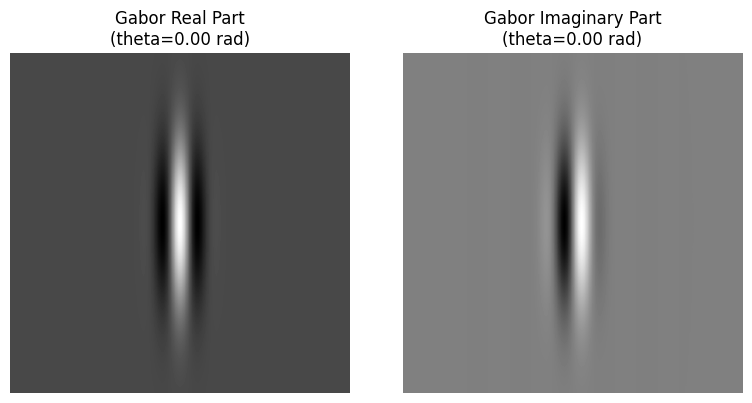

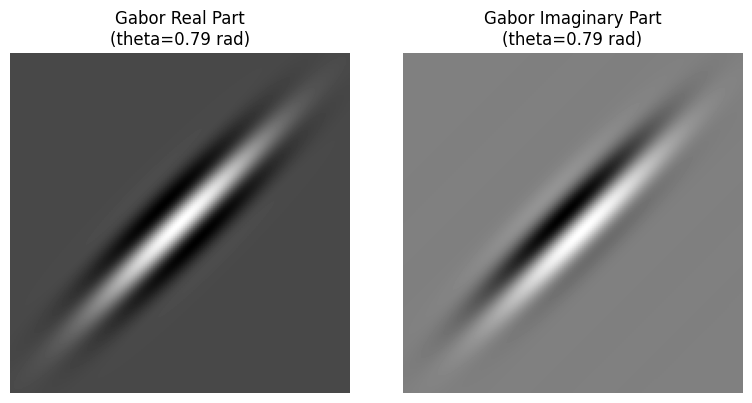

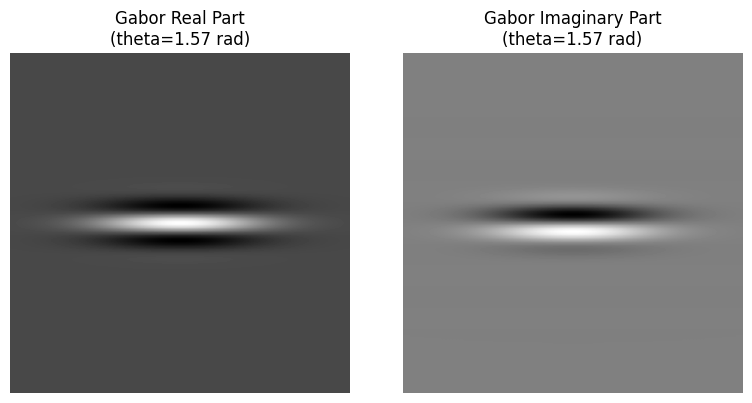

In [13]:
lamda = 30
psi = 0
gamma = 0.25
sigma = 10
theta_vals = [0, np.pi/4, np.pi/2]

for theta in theta_vals:
    my_gabor = create_gabor(sigma, theta, lamda, psi, gamma)
    plt.figure(figsize=(8, 4))
    plt.subplot(1, 2, 1)
    plt.imshow(my_gabor[:, :, 0], cmap='gray')
    plt.title(f'Gabor Real Part\n(theta={theta:.2f} rad)')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(my_gabor[:, :, 1], cmap='gray')
    plt.title(f'Gabor Imaginary Part\n(theta={theta:.2f} rad)')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

<a id="question-11"></a>
#### <font color='#FF0000'>Question 11 (1 point)</font>

Visualize how the parameter $\sigma$ affects the Gabor filter in the spatial domain. Use the following steps:

1. Initialize the parameters as follows: $\lambda = 35$, $\theta = \pi/6$, $\psi = \pi/4$, $\sigma = 10$, $\gamma = 0.5$.
2. Set $\sigma$ to $10$, $30$, and $45$ while keeping the other parameters unchanged.
3. Generate and display the Gabor filters corresponding to each value of $\sigma$.
4. Ensure that each image in the visualization is clearly labeled to indicate the value of $\sigma$ it represents.

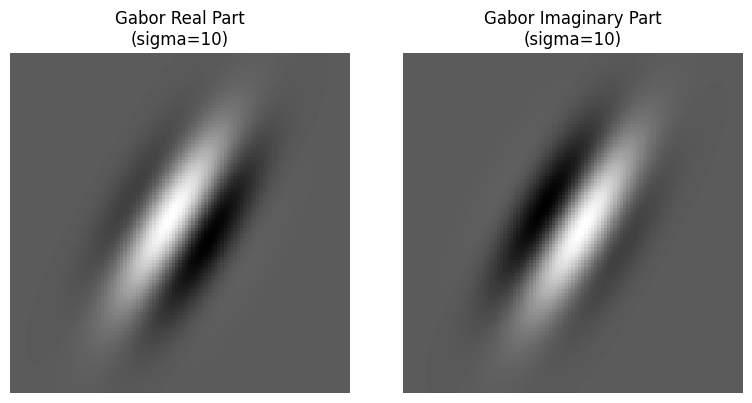

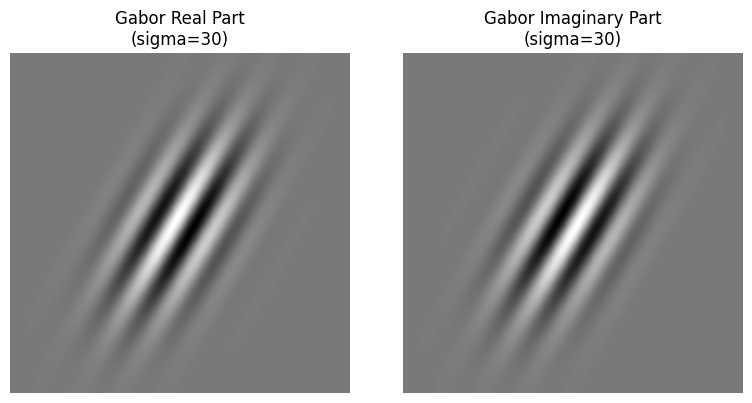

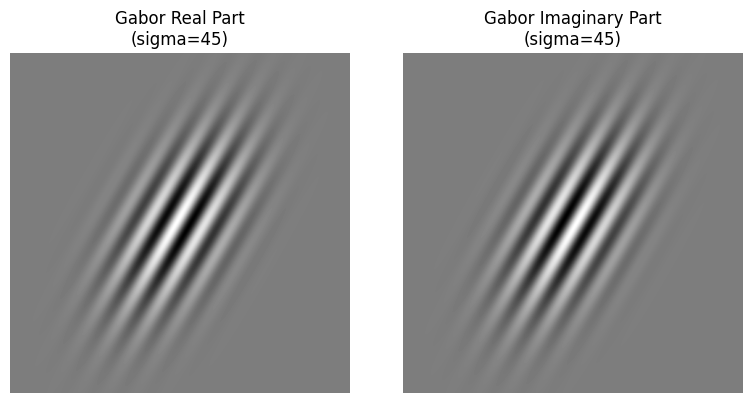

In [14]:
lamda = 35
theta = np.pi / 6
psi = np.pi /4 
gamma = 0.5
sigma_vals = [10, 30, 45]

for sigma in sigma_vals:
    my_gabor = create_gabor(sigma, theta, lamda, psi, gamma)
    plt.figure(figsize=(8, 4))
    plt.subplot(1, 2, 1)
    plt.imshow(my_gabor[:, :, 0], cmap='gray')
    plt.title(f'Gabor Real Part\n(sigma={sigma})')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(my_gabor[:, :, 1], cmap='gray')
    plt.title(f'Gabor Imaginary Part\n(sigma={sigma})')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

<a id="question-12"></a>
#### <font color='#FF0000'>Question 12 (1 point)</font>

Visualize how the parameter $\gamma$ affects the Gabor filter in the spatial domain. Use the following steps:

1. Initialize the parameters as follows: $\lambda = 25$, $\theta = \pi/3$, $\psi = \pi/6$, $\sigma = 8$, $\gamma = 0.75$.
2. Set $\gamma$ to $.25$, $.50$, and $.75$ while keeping the other parameters unchanged.
3. Generate and display the Gabor filters corresponding to each value of $\gamma$.
4. Ensure that each image in the visualization is clearly labeled to indicate the value of $\gamma$ it represents.


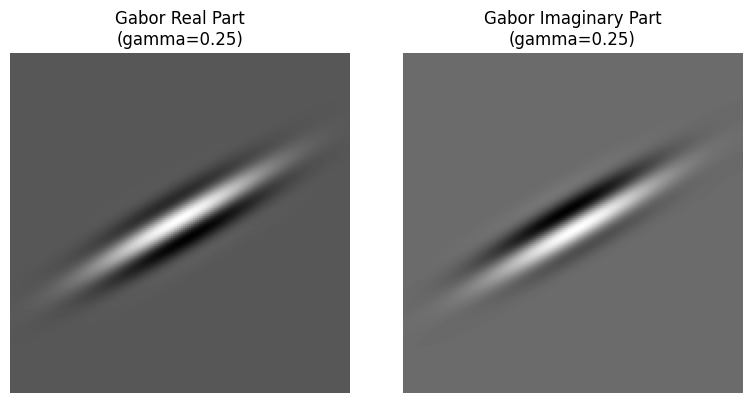

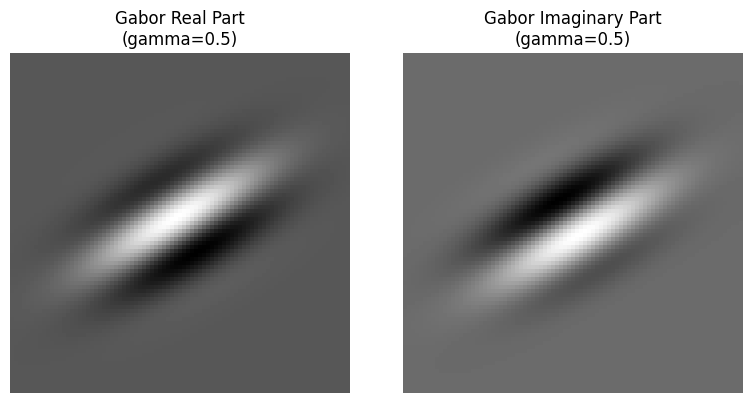

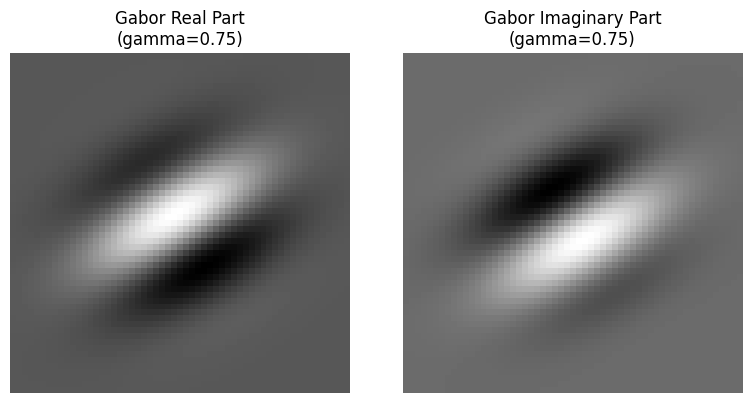

In [15]:
lamda = 25
theta = np.pi / 3
psi = np.pi / 6
sigma = 8
gamma_vals = [0.25, 0.5, 0.75]

for gamma in gamma_vals:
    my_gabor = create_gabor(sigma, theta, lamda, psi, gamma)
    plt.figure(figsize=(8, 4))
    plt.subplot(1, 2, 1)
    plt.imshow(my_gabor[:, :, 0], cmap='gray')
    plt.title(f'Gabor Real Part\n(gamma={gamma})')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(my_gabor[:, :, 1], cmap='gray')
    plt.title(f'Gabor Imaginary Part\n(gamma={gamma})')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

<a id="question-13"></a>
#### <font color='#FF0000'>Question 13 (6 points)</font>

Based on the visualizations of parameters and your self-study on Gabor filters, explain briefly:

1. What do the parameters $\lambda$, $\theta$, $\psi$, $\sigma$, and $\gamma$ control?
2. How do these parameters visually influence the Gabor filter kernel?

##### <font color='yellow'>Answer:</font>

Let us start off with the parameters whose effects on the Gabor filter kernel we have actually visualised in the above exercises.

Thus, we begin with $\theta$, which is the angle controlling the angular orientation of the filter in the frequency domain. It does this by specifying the angle of the sinusoidal pattern within the Gaussian envelope. Thus, it determines which edge or texture directions the filter is most responsive to. For instance, a $\theta$ of $0\degree$ makes the filter sensitive to vertical features, while a $\theta$ of $90\degree$ makes it sensitive to horizontal ones. Intermmediate values detect diagonals. $\textbf{Visually}$, its influence on the Gabor filter kernel, as observed in the visualisations computed above is that it simply rotates the stripe pattern within the kernel. At $\theta=0$, the bands are vertical; at $\theta=\pi/4$, they are diagonal; and at $\theta=\pi/2$, they are horizontal. The kernel thus has the same underlying pattern, but is rotated according to $\theta$.

Next, we examine $\sigma$, which determines the overall size of the Gabor envelope. A small $\sigma$ yields a compact kernel that captures very local features but with less frequency selectivity, whereas a large $\sigma$ makes the filter cover a wider area, improving frequency selectivity but reducing spatial precision. Visually, the standard deviation's effect on the Gabor filter kernel is the following. With small $\sigma=10$, only a few visible stripes fit inside the envelop, and most of the kernel outside the center is suppressed. However, as $\sigma$ increases ($\sigma=30,45$), the Gaussian spreads wider and the sinusoid extends across a larger region of the kernel. This produces more parallel stripes. Thus, larger $\sigma$ values make the filter have more stripes, and be less confined to the center.

Next, we examine $\gamma$, which indicates the height of the Gabor function. It is also said to specify the ellipticity of the support of the Gabor function. This means that it controls the balance between the elongation and circularity of the aspect ratio. When $\gamma$ is less than 1, the envelope is stretched along the filter's orientation axis, which makes the kernel more sensitive to edges in that direction. As $\gamma$ increases towards 1, the envelope becomes more circular, which reduces elongation and decreases orientation sensitivity. Visually, as observed in the above images, with small $\gamma$ values - e.g., $0.25$ - the kernel looks long and narrow, acting like a thin edge detector. As $\gamma$ increases towards 1, however, the kernel becomes rounder and more balanced. This weakens directional emphasis.\

Next, we move onto the two parameters whose effects on the Gabor filter kernel we did not visualise in the above exercises.

Firstly, we discuss $\lambda$, which is the wavelength of the sinusoidal factor. A small wavelength corresponds to a high spatial frequency, making the filter sensitive to fine details and textures. A larger wavelength corresponds to lower spatial frequency, capturing primarily large-scale structures. That is, $\lambda$ determines whether the filter emphasises local details or borader patterns. Visually, decreasing $\lambda$ should produce kernels with tightly packed black-and-white stripes, while increasing it should widen the spacing between the lines. This would leave fewer, wider bands, which capture only broad structures.

Lastly, we look at the phase offest $\psi$, which shifts the sinusoidal wave relative to the Gaussian envelope, and decides whether the filter responds best to symmetric or asymmetric features (ridges/lines vs edges). Visually, with $\psi-0$, the kernel should have a bright strip at the centre, making it most sensitive to ridge-like features. However, as $\psi$ increases to, e.g., $\psi=\pi/2$, the bright and dark bands shift so that the center becomes a boundary and the filter respodns to edges rather than ridges.


$\textbf{SOURCES FOR INSPIRATION}$

MVTec Software GmbH. (2021, October 26). Gabor filter: What is it for? MVTec. https://www.mvtec.com/company/news/article/gabor-filter-what-is-it-for

Elsevier. (n.d.). Gabor function. In ScienceDirect Topics. Retrieved September 18, 2025, from https://www.sciencedirect.com/topics/computer-science/gabor-function

Wikipedia contributors. (2025, September 14). Gabor filter. In Wikipedia. https://en.wikipedia.org/wiki/Gabor_filter

Shah, A. (2018, May 30). Through the eyes of Gabor filter. Medium. https://medium.com/@anuj_shah/through-the-eyes-of-gabor-filter-17d1fdb3ac97

<a id="section-4"></a>
### **Section 4: Noise in digital images**

Digital images are often plagued by various types of noise that can significantly degrade their quality. These imperfections might originate during the image acquisition process, where sensors introduce noise, or through user errors, such as incorrect camera settings. For example, some medical imaging modalities generate low-resolution images (e.g., 128x128 pixels) that are particularly susceptible to noise. Given the exponential increase in the number of photos taken daily, enhancing noisy or corrupted images has become a critical area of research in image processing.

Noise in digital images can manifest in several ways, two of the most common being salt-and-pepper noise and additive Gaussian noise.

**Salt-and-Pepper Noise:** This type of noise is characterized by random occurrences of black and white pixels scattered across the image. It can result from overexposure, which creates "hot" pixels, or from defective sensors, leading to "dead" pixels. These randomly placed black and white pixels resemble the appearance of salt and pepper sprinkled on the image, hence the name.

**Additive Gaussian Noise:** Another prevalent type of noise is additive Gaussian noise, often associated with thermal effects in the camera sensor. This noise is modeled by adding a random value to each pixel in the image. The random value, denoted by $\epsilon$, is drawn from a Gaussian distribution with a mean of 0 and a standard deviation, $\sigma$, which represents the noise level. The relationship between the original image $\mathbf{I}(x)$ and the noisy image $\mathbf{I}^{\prime}(x)$ can be described by the following equation:

$\mathbf{I}^{\prime}(x) = \mathbf{I}(x) + \epsilon \quad \text{where} \quad \epsilon \sim \mathcal{N}(0, \sigma^2)$ *(Equation D)*

In this scenario, $\mathbf{I}(x)$ represents the original image, and $\mathbf{I}^{\prime}(x)$ is the resulting image after Gaussian noise has been added. The noise $\epsilon$ is sampled independently for each pixel from the Gaussian distribution $\mathcal{N}(0, \sigma^2)$, where $\sigma$ controls the intensity of the noise. As $\sigma$ increases, the image becomes progressively noisier.

Both salt-and-pepper noise and additive Gaussian noise are common in real-world imaging scenarios and require effective noise reduction techniques. In the upcoming sections, we will explore various methods for mitigating these types of noise, enhancing the quality of digital images, and ensuring that the final images are closer to their true representations.

<a id="question-14"></a>
#### <font color='#FF0000'>Question 14 (2 points)</font>

The Peak Signal-to-Noise Ratio (PSNR) is a commonly used metric for quantitatively evaluating the performance of image enhancement algorithms. It is derived from the Mean Squared Error (MSE), which measures the average squared difference between the original image and the enhanced (or approximated) image. The MSE is defined as:

$MSE = \frac{1}{m \cdot n} \sum_{x,y}\left[\mathbf{I}(x,y) - \mathbf{\hat{I}}(x,y)\right]^2$ *(Equation E)*

where $\mathbf{I}$ is the original image of size $m \times n$, and $\mathbf{\hat{I}}$ is the enhanced or approximated version of the image.

The PSNR is then calculated using the MSE, and it quantifies how close the enhanced image is to the original image. The PSNR is defined as:

$PSNR = 10 \cdot \log_{10} \left(\frac{\mathbf{I}_{max}^2}{MSE}\right) \\
= 20 \cdot \log_{10} \left(\frac{\mathbf{I}_{max}}{\sqrt{MSE}}\right) \\
= 20 \cdot \log_{10} \left(\frac{\mathbf{I}_{max}}{RMSE}\right)$

where $\mathbf{I}_{max}$ is the maximum possible pixel value of the image (e.g., 255 for an 8-bit image), and $RMSE$ is the root of the MSE.

Given this understanding, answer the following:

When comparing different methods using the PSNR metric, is a higher value better, or is the opposite true? Explain your answer briefly.

##### <font color='yellow'>Answer:</font>

PSNR increases as MSE (error) decreases, so a larger PSNR means the enhanced image is closer to the original (less distortion/noise).

<a id="question-15"></a>
#### <font color='#FF0000'>Question 15 (4 points)</font>

Implement the function `calculate_psnr()` to calculate the Peak Signal-to-Noise Ratio (PSNR) for both grayscale and RGB images. The function should take two images as input: the original image and its enhanced (or approximated) version.

When implementing `calculate_psnr()`, ensure that it works correctly for both grayscale and RGB images. For RGB images, consider how the PSNR formula should be adjusted. Specifically, think about whether to compute the PSNR for each channel separately and then combine the results, or handle the RGB image differently.

**Note:** You are not allowed to use any Python built-in functions from the *PIL* or *Skimage* libraries or any other libraries except for *NumPy*.

In [16]:
def calculate_psnr(orig_image, approx_image):
    '''
    Computes the PSNR (Peak Signal-to-Noise Ratio) between an original image and its enhanced version.

    Args:
        orig_image: The original image (can be grayscale or RGB).
        approx_image: The enhanced or approximated version of the original image.

    Returns:
        psnr_value: The PSNR value in decibels (dB).
    '''

    # calculate Mean Squared Error over all pixels (and channels if RGB)
    mse = np.mean((orig_image - approx_image) ** 2)
    if mse == 0:
        return float('inf')

    # find maximum possible pixel value
    if np.issubdtype(np.asarray(orig_image).dtype, np.integer):
        max_pixel_value = float(np.iinfo(np.asarray(orig_image).dtype).max)
    else:
        # For float images, assume [0,1] if data appears normalized; else [0,255]
        mx = float(orig_image.max())
        max_pixel_value = 1.0 if mx <= 1.0 else (255.0 if mx <= 255.0 else mx)

    # calculate rmse and psnr
    rmse = np.sqrt(mse)
    psnr_value = 20.0 * np.log10(max_pixel_value / rmse)

    return psnr_value

<a id="question-16"></a>
#### <font color='#FF0000'>Question 16 (1 point)</font>

Using your implemented function `calculate_psnr()`, compute and print the PSNR between `frans_bauer.png` and `frans_bauer_salt_pepper.png`.

**Hint:** Ensure that the data type of the images is `float32` before computation.

In [17]:
# load the images
frans_bauer_image = cv2.imread("images/frans_bauer.png", cv2.IMREAD_GRAYSCALE)
frans_bauer_salt_pepper_image = cv2.imread("images/frans_bauer_salt_pepper.png", cv2.IMREAD_GRAYSCALE)

# convert the images to float32 arrays
frans_bauer = np.array(frans_bauer_image, dtype=np.float32)
frans_bauer_salt_pepper = np.array(frans_bauer_salt_pepper_image, dtype=np.float32)

# apply calculate_psnr function
psnr_value = calculate_psnr(frans_bauer, frans_bauer_salt_pepper)
print(f"PSNR value between frans_bauer.png and frans_bauer_salt_pepper.png is: {psnr_value}")

PSNR value between frans_bauer.png and frans_bauer_salt_pepper.png is: 17.921403360665206


<a id="question-17"></a>
#### <font color='#FF0000'>Question 17 (1 point)</font>

Using your implemented function `calculate_psnr()`, compute and print the PSNR between `frans_bauer.png` and `frans_bauer_gaussian.png`.

**Hint:** Ensure that the data type of the images is `float32` before computation.

In [18]:
# load the images
frans_bauer_image = cv2.imread("images/frans_bauer.png", cv2.IMREAD_GRAYSCALE)
frans_bauer_gaussian_image = cv2.imread("images/frans_bauer_gaussian.png", cv2.IMREAD_GRAYSCALE)

# convert the images to float32 arrays
frans_bauer = np.array(frans_bauer_image, dtype=np.float32)
frans_bauer_gaussian = np.array(frans_bauer_gaussian_image, dtype=np.float32)

# apply calculate_psnr function
psnr_value = calculate_psnr(frans_bauer, frans_bauer_gaussian)
print(f"PSNR value between frans_bauer.png and frans_bauer_salt_pepper.png is: {psnr_value}")

PSNR value between frans_bauer.png and frans_bauer_salt_pepper.png is: 27.73598716682882


<a id="question-18"></a>
#### <font color='#FF0000'>Question 18 (3 points)</font>

Design a function called `denoise_image()` to remove two types of noise: salt-and-pepper noise and Gaussian noise. The function should denoise the image by applying one of the following methods: box filtering using **cv2.blur** function, median filtering using **cv2.medianBlur** function, or Gaussian filtering using **cv2.GaussianBlur** function.

In [19]:
def denoise_image(input_image, kernel_type, kernel_size=3, sigma=1):
    '''
    Function denoises the image using the specified kernel type:
    - 'box': by using a box filter
    - 'median': by using a median filter
    - 'gaussian': by using a gaussian filter

    Args:
        input_image: The input image to be denoised.
        kernel_type: A string specifying the type of filter ('box', 'median', or 'gaussian').
        kernel_size: Size of the kernel to be used for filtering (default is 3).
        sigma: Standard deviation for the Gaussian kernel (used only for the gaussian filter).

    Returns:
        denoised_image: The denoised image.
    '''

    if kernel_type == 'box':
        denoised_image = cv2.blur(input_image, (kernel_size, kernel_size))

    elif kernel_type == 'median':
        denoised_image = cv2.medianBlur(input_image, kernel_size)

    elif kernel_type == 'gaussian':
        denoised_image = cv2.GaussianBlur(input_image, (kernel_size, kernel_size), sigma)

    else:
        raise ValueError('Kernel type not implemented. Choose between "box", "median", or "gaussian".')

    return denoised_image

<a id="question-19"></a>
#### <font color='#FF0000'>Question 19 (2 points)</font>

Using your implemented function **denoise_image()**, denoise the `frans_bauer_salt_pepper.png` and `frans_bauer_gaussian.png` images by applying box filtering with kernel sizes of 3x3, 5x5, and 7x7. Display the resulting denoised images.

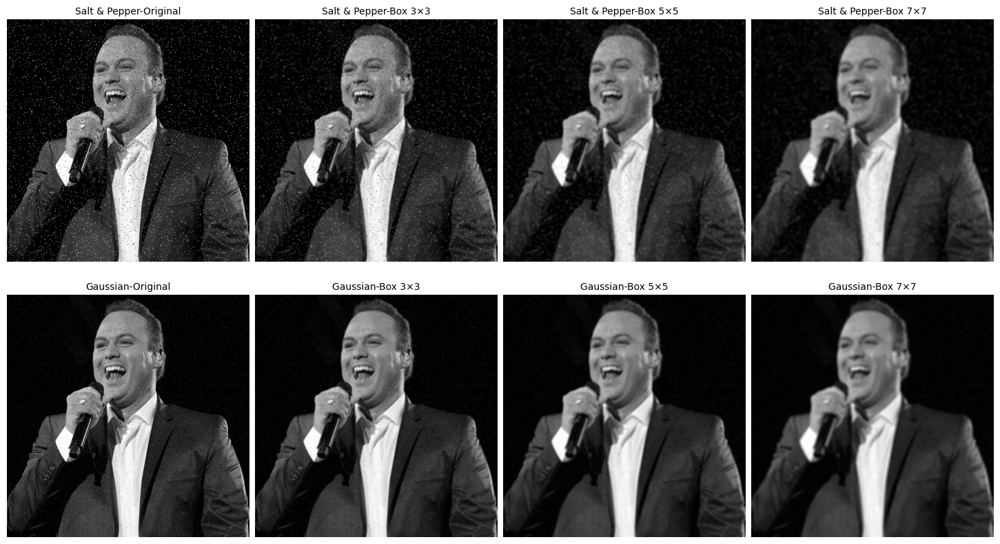

In [20]:
# load the images
frans_bauer_gaussian_image = cv2.imread("images/frans_bauer_gaussian.png", cv2.IMREAD_GRAYSCALE)
frans_bauer_salt_pepper_image = cv2.imread("images/frans_bauer_salt_pepper.png", cv2.IMREAD_GRAYSCALE)

# convert the images to float32 arrays
frans_bauer_gaussian = np.array(frans_bauer_gaussian_image, dtype=np.float32)
frans_bauer_salt_pepper = np.array(frans_bauer_salt_pepper_image, dtype=np.float32)

# denoise the images using box filtering with different kernel sizes
kernel_sizes = [3, 5, 7]

box_salt_pepper_outs = []
box_gaussian_outs = []
for k in kernel_sizes:
    box_salt_pepper_outs.append(denoise_image(frans_bauer_salt_pepper, 'box', k))
    box_gaussian_outs.append(denoise_image(frans_bauer_gaussian, 'box', k))

# plotting
ncols = 1 + len(kernel_sizes)
fig, axes = plt.subplots(2, ncols, figsize=(3.6*ncols, 8), constrained_layout=True)

rows = [
    ("Salt & Pepper", frans_bauer_salt_pepper, box_salt_pepper_outs),
    ("Gaussian", frans_bauer_gaussian, box_gaussian_outs),
]

for r, (row_label, original, outs) in enumerate(rows):

    # first column: original
    ax = axes[r, 0]
    ax.imshow(original, cmap='gray')
    ax.set_title(f"{row_label}-Original", fontsize=10)
    ax.set_ylabel(row_label, fontsize=10)
    ax.axis('off')

    # remaining columns: denoised results
    for c, (k, img) in enumerate(zip(kernel_sizes, outs), start=1):
        ax = axes[r, c]
        ax.imshow(img, cmap='gray')
        ax.set_title(f"{row_label}-Box {k}×{k}", fontsize=10)
        ax.axis('off')

plt.show()

<a id="question-20"></a>
#### <font color='#FF0000'>Question 20 (2 points)</font>

Using your implemented function **denoise_image()**, denoise the `frans_bauer_salt_pepper.png` and `frans_bauer_gaussian.png` images by applying median filtering with kernel sizes of 3x3, 5x5, and 7x7. Display the resulting denoised images.

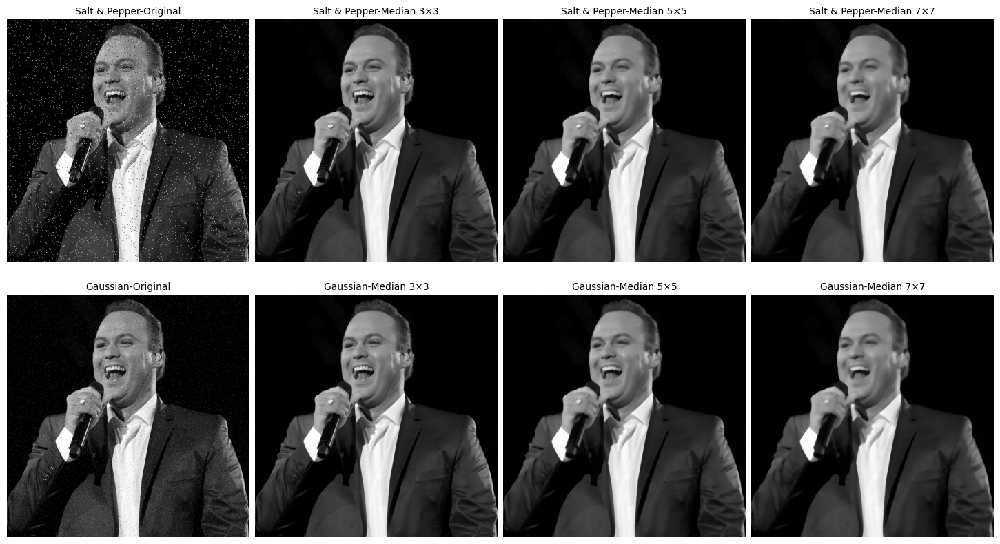

In [21]:
# load the images
frans_bauer_gaussian_image = cv2.imread("images/frans_bauer_gaussian.png", cv2.IMREAD_GRAYSCALE)
frans_bauer_salt_pepper_image = cv2.imread("images/frans_bauer_salt_pepper.png", cv2.IMREAD_GRAYSCALE)

# convert the images to float32 arrays
frans_bauer_gaussian = frans_bauer_gaussian_image.astype(np.uint8)
frans_bauer_salt_pepper = frans_bauer_salt_pepper_image.astype(np.uint8)

# denoise the images using box filtering with different kernel sizes
kernel_sizes = [3, 5, 7]

median_salt_pepper_outs = []
median_gaussian_outs = []
for k in kernel_sizes:
    median_salt_pepper_outs.append(denoise_image(frans_bauer_salt_pepper, 'median', k))
    median_gaussian_outs.append(denoise_image(frans_bauer_gaussian, 'median', k))

# plotting
ncols = 1 + len(kernel_sizes)
fig, axes = plt.subplots(2, ncols, figsize=(3.6*ncols, 8), constrained_layout=True)

rows = [
    ("Salt & Pepper", frans_bauer_salt_pepper, median_salt_pepper_outs),
    ("Gaussian", frans_bauer_gaussian, median_gaussian_outs),
]

for r, (row_label, original, outs) in enumerate(rows):

    # first column: original
    ax = axes[r, 0]
    ax.imshow(original, cmap='gray')
    ax.set_title(f"{row_label}-Original", fontsize=10)
    ax.set_ylabel(row_label, fontsize=10)
    ax.axis('off')

    # remaining columns: denoised results
    for c, (k, img) in enumerate(zip(kernel_sizes, outs), start=1):
        ax = axes[r, c]
        ax.imshow(img, cmap='gray')
        ax.set_title(f"{row_label}-Median {k}×{k}", fontsize=10)
        ax.axis('off')

plt.show()

<a id="question-21"></a>
#### <font color='#FF0000'>Question 21 (3 points)</font>

Using your implemented function **my_psnr()**, compute the PSNR for each of the 12 denoised images (from Questions 19 and 20) with respect to the original `frans_bauer.png` image. Present your results in a clear and readable format **and** discuss the effect of the filter size on the PSNR. 

**Hint:** Ensure that the images are loaded as `float32` before computation.

denoise the image using box filter
  salt pepper-
    psnr value for kernel size 3: 25.76877066402726
    psnr value for kernel size 5: 26.385292059035553
    psnr value for kernel size 7: 25.761296357220257
  gaussian-
    psnr value for kernel size 3: 30.900865178351555
    psnr value for kernel size 5: 28.326808693201645
    psnr value for kernel size 7: 26.796090355566502

denoise the image using median filter
  salt pepper-
    psnr value for kernel size 3: 34.83184796493939
    psnr value for kernel size 5: 31.340765755103487
    psnr value for kernel size 7: 29.711931244769993
  gaussian-
    psnr value for kernel size 3: 34.337087537690074
    psnr value for kernel size 5: 31.266552985495185
    psnr value for kernel size 7: 29.654195736326447


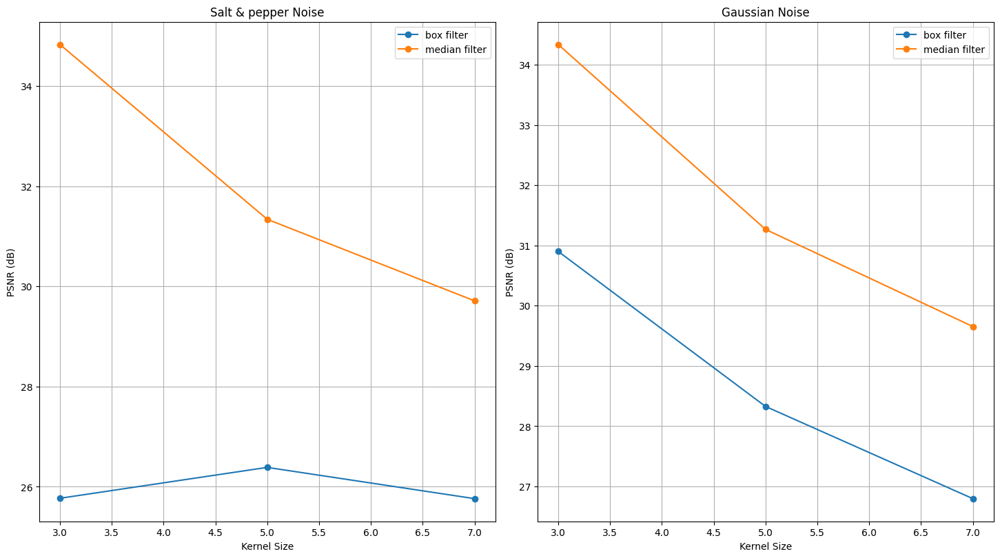

<Figure size 640x480 with 0 Axes>

In [22]:
box_psnr_dict = {}
box_psnr_dict["salt_pepper"] = []
box_psnr_dict["gaussian"] = []
print("denoise the image using box filter")
print("  salt pepper-")
for k, img in zip(kernel_sizes, box_salt_pepper_outs):
    psnr_value = calculate_psnr(frans_bauer, img.astype(np.float32))
    box_psnr_dict['salt_pepper'].append(psnr_value)
    print(f"    psnr value for kernel size {k}: {psnr_value}")

print("  gaussian-")
for k, img in zip(kernel_sizes, box_gaussian_outs):
    psnr_value = calculate_psnr(frans_bauer, img.astype(np.float32))
    box_psnr_dict['gaussian'].append(psnr_value)
    print(f"    psnr value for kernel size {k}: {psnr_value}")

median_psnr_dict = {}
median_psnr_dict["salt_pepper"] = []
median_psnr_dict["gaussian"] = []
print()
print("denoise the image using median filter")
print("  salt pepper-")
for k, img in zip(kernel_sizes, median_salt_pepper_outs):
    psnr_value = calculate_psnr(frans_bauer.astype(np.float32), img.astype(np.float32))
    median_psnr_dict['salt_pepper'].append(psnr_value)
    print(f"    psnr value for kernel size {k}: {psnr_value}")

print("  gaussian-")
for k, img in zip(kernel_sizes, median_gaussian_outs):
    psnr_value = calculate_psnr(frans_bauer.astype(np.float32), img.astype(np.float32))
    median_psnr_dict['gaussian'].append(psnr_value)
    print(f"    psnr value for kernel size {k}: {psnr_value}")

# plot results in a psnr vs. kernel_size graph for each noise type
plt.figure(figsize=(3.6*ncols, 8), constrained_layout=True)
plt.subplot(1, 2, 1)
plt.plot(kernel_sizes, box_psnr_dict["salt_pepper"], marker='o', label='box filter')
plt.plot(kernel_sizes, median_psnr_dict["salt_pepper"], marker='o', label='median filter')
plt.title('Salt & pepper Noise')
plt.legend()
plt.grid(True)
plt.xlabel('Kernel Size')
plt.ylabel('PSNR (dB)')

plt.subplot(1, 2, 2)
plt.plot(kernel_sizes, box_psnr_dict["gaussian"], marker='o', label='box filter')
plt.plot(kernel_sizes, median_psnr_dict["gaussian"], marker='o', label='median filter')
plt.title('Gaussian Noise')
plt.legend()
plt.grid(True)
plt.xlabel('Kernel Size')
plt.ylabel('PSNR (dB)')

plt.show()
plt.tight_layout()










##### <font color='yellow'>Answer:</font>

Based on the results we can reach the following conclusions:

Effect of kernel size-
- Across both noises and both filters, PSNR generally drops as the kernel grows. Bigger windows suppress noise more aggressively but also blur edges and textures, so the MSE to the original rises and PSNR falls.
- The only exception in our runs is salt-and-pepper + box filter, where PSNR is slightly higher at 5×5 than 3×3, then drops again at 7×7. With impulsive noise, averaging over a slightly larger neighborhood dilutes the extreme outliers better than 3×3, but once the window becomes too large the blur dominates.

Filter comparison-
- For salt-and-pepper noise, the median filter clearly outperforms the box filter at every size, which is expected because median is robust to outliers and preserves edges.
- For Gaussian noise, PSNR also decreases with kernel size for both filters, and in our measurements the median filter is slightly higher than the box filter at each size—likely because it preserves edges better on this image even though Gaussian/mean smoothing is the classic match for Gaussian noise.

<a id="question-22"></a>
#### <font color='#FF0000'>Question 22 (2 points)</font>

Which filter is more effective for removing salt-and-pepper noise, box or median filters? Explain your reasoning. Also, consider which filter performs better for Gaussian noise and why.

##### <font color='yellow'>Answer:</font>

we notice that:
- A box (mean) filter replaces the center pixel with the average of the values in the window.
- A median filter replaces it with the median of those values.

Salt-and-pepper noise → median wins.
- Salt-and-pepper noise is impulsive (pixels jump to 0 or 255). The median is robust to such outliers—specks don’t move the median unless they dominate the window—so it removes the spikes while preserving edges.
- The box average, in contrast, is pulled toward the 0/255 outliers and leaves residual speckle while also blurring edges. This is why, visually and by PSNR, the median filter is more effective on salt-and-pepper noise in your results.

Gaussian noise → theory favors the mean, practice can favor the median.
- With zero-mean Gaussian noise, if you average more pixels, the random errors cancel out more, so the noise level goes down.
- For Gaussian data, the mean (average) is the most efficient unbiased estimator — it gives the lowest possible noise after combining samples.
- so in theory a mean/box filter should yield higher PSNR on purely Gaussian noise.
- However, on real images and small windows, the box filter blurs edges strongly. The median preserves edges better, and that edge preservation can outweigh its lower noise-reduction efficiency, producing higher PSNR for the median—which is what you observed.

<a id="question-23"></a>
#### <font color='#FF0000'>Question 23 (2 points)</font>

Using your implemented function **denoise_image()**, denoise the `frans_bauer_gaussian.png` image by applying Gaussian filtering with kernel sizes of 3x3, 5x5, and 7x7, and standard deviations of 0.5, 1, 3, and 7.

Display the resulting denoised images.

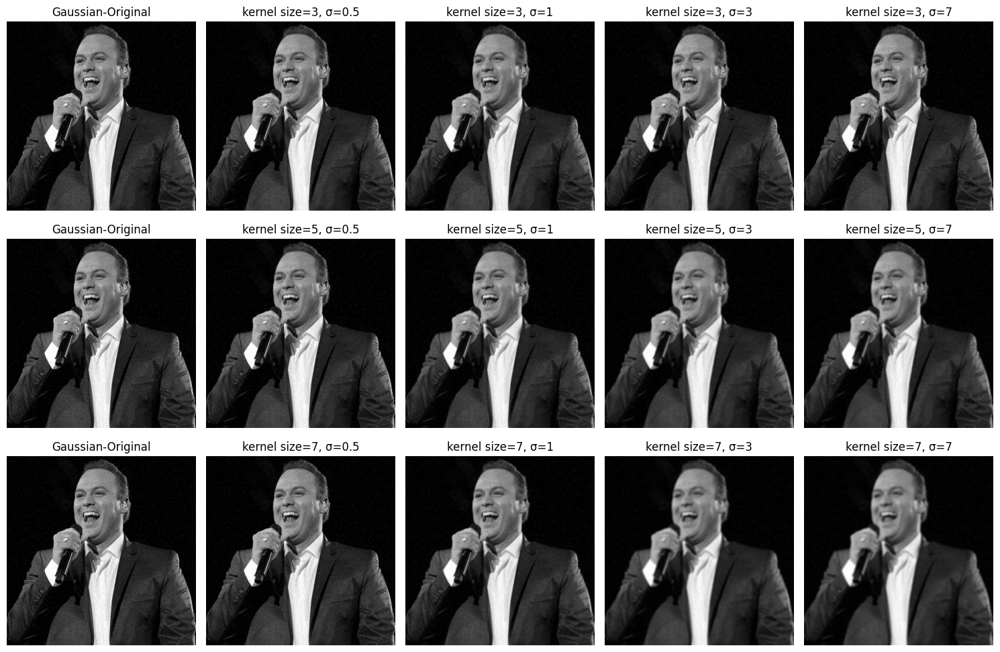

In [23]:
# load the image
frans_bauer_gaussian_image = cv2.imread("images/frans_bauer_gaussian.png", cv2.IMREAD_GRAYSCALE)

# convert the image to float32 arrays
frans_bauer_gaussian = frans_bauer_gaussian_image.astype(np.uint8)

# kernel sizes and sigma values
kernel_sizes = [3, 5, 7]
sigmas = [0.5, 1, 3, 7]

# Create the figure
fig, axes = plt.subplots(len(kernel_sizes), 1+len(sigmas), figsize=(15, 10))

# For each row (kernel size)
for i, k in enumerate(kernel_sizes):
    # First column: original image
    axes[i, 0].imshow(frans_bauer_gaussian, cmap='gray')
    axes[i, 0].set_title(f"Gaussian-Original")
    axes[i, 0].set_ylabel(f"Kernel {k}×{k}", fontsize=12)
    axes[i, 0].axis('off')

    # Remaining columns: denoised images with different sigma values
    for j, sigma in enumerate(sigmas):
        # Apply denoising with current kernel size and sigma
        denoised = denoise_image(frans_bauer_gaussian, 'gaussian', k, sigma)

        # Display the result
        axes[i, j+1].imshow(denoised, cmap='gray')
        axes[i, j+1].set_title(f"kernel size={k}, σ={sigma}")
        axes[i, j+1].axis('off')

plt.tight_layout()
plt.show()

<a id="question-24"></a>
#### <font color='#FF0000'>Question 24 (3 points)</font>

Present your results for the PSNR scores of the 12 images from Question 22 in a clear and readable format **and** discuss the effect of the standard deviation on the PSNR.

denoise the image using gaussian filter
  kernel size=3
    psnr value for sigma 0.5: 30.96629944979393
    psnr value for sigma 1: 31.702213493741255
    psnr value for sigma 3: 30.994384315082883
    psnr value for sigma 7: 30.918031159146743
  kernel size=5
    psnr value for sigma 0.5: 30.971202753348486
    psnr value for sigma 1: 31.057952776082796
    psnr value for sigma 3: 28.67023780344994
    psnr value for sigma 7: 28.389511980496046
  kernel size=7
    psnr value for sigma 0.5: 30.971202753348486
    psnr value for sigma 1: 30.99541066816686
    psnr value for sigma 3: 27.4366437596227
    psnr value for sigma 7: 26.91343034570437


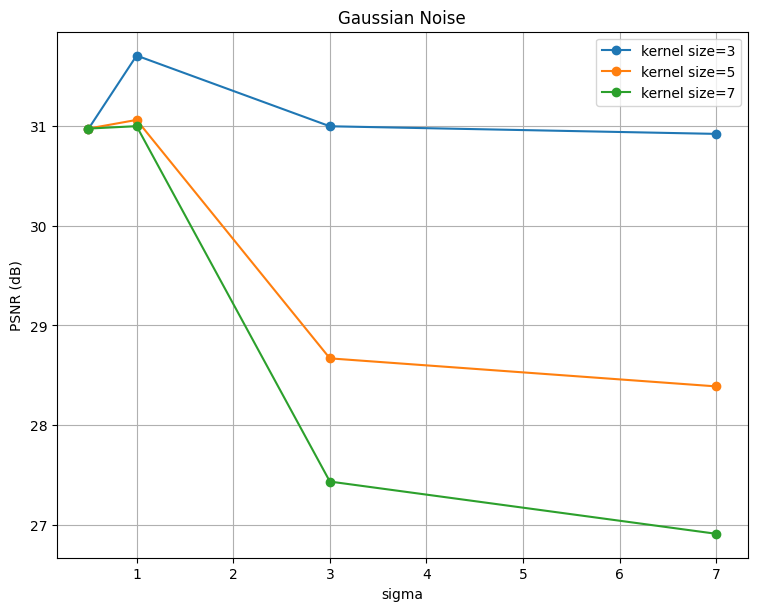

<Figure size 640x480 with 0 Axes>

In [24]:
# load the images
frans_bauer_gaussian_image = cv2.imread("images/frans_bauer_gaussian.png", cv2.IMREAD_GRAYSCALE)
frans_bauer_image = cv2.imread("images/frans_bauer.png", cv2.IMREAD_GRAYSCALE)

# convert the images to float32 arrays
frans_bauer_gaussian = np.array(frans_bauer_gaussian_image, dtype=np.float32)
frans_bauer = np.array(frans_bauer_image, dtype=np.float32)

# kernel sizes and sigma values
kernel_sizes = [3, 5, 7]
sigmas = [0.5, 1, 3, 7]
psnr_dict = {3: [], 5: [], 7: []}
print("denoise the image using gaussian filter")
for k in kernel_sizes:
    print(f"  kernel size={k}")
    for sigma in sigmas:
        # Apply denoising with current kernel size and sigma
        denoised = denoise_image(frans_bauer_gaussian, 'gaussian', k, sigma)
        psnr_value = calculate_psnr(frans_bauer, denoised)
        psnr_dict[k].append(psnr_value)
        print(f"    psnr value for sigma {sigma}: {psnr_value}")

# plot results in a psnr vs. sigma graph for each noise graph related to a different kernel size
plt.figure(figsize=(3.6*ncols, 6), constrained_layout=True)
plt.subplot(1, 2, 1)
plt.plot(sigmas, psnr_dict[3], marker='o', label='kernel size=3')
plt.plot(sigmas,psnr_dict[5], marker='o', label='kernel size=5')
plt.plot(sigmas, psnr_dict[7], marker='o', label='kernel size=7')
plt.title('Gaussian Noise')
plt.legend()
plt.grid(True)
plt.xlabel('sigma')
plt.ylabel('PSNR (dB)')
plt.show()
plt.tight_layout()

##### <font color='yellow'>Answer:</font>

We will notice that the Gaussian filter is a low-pass smoother. The standard deviation σ controls how wide the weighting is:
- Small σ → weights concentrated near the center → little smoothing, details preserved.
- Large σ → weights spread out → strong smoothing, edges and textures get blurred.

Observed pattern:
- For every kernel size, PSNR increases slightly from σ=0.5 to σ=1, then drops as σ grows (σ=3, 7).
Interpretation: a moderate σ (~1) best balances noise removal and detail preservation. When σ is too small the filter doesn’t reduce noise enough; when σ is large, oversmoothing blurs edges and raises the MSE, so PSNR falls.
- Across all σ, the smallest kernel (3×3) gives the highest PSNR. Larger kernels introduce more blur for the same σ. (Also, for large σ a small kernel truncates the Gaussian, which further degrades performance.)

conclusion:
- There’s a clear trade-off: increasing σ reduces noise but increasingly hurts fidelity to the original image. In this experiment, the best PSNR is achieved with k=3 and σ≈1; beyond that, oversmoothing dominates and PSNR declines.

<a id="question-25"></a>
#### <font color='#FF0000'>Question 25 (2 points)</font>

What is the difference among median filtering, box filtering, and Gaussian filtering? Briefly explain how they are different at a conceptual level. If two filtering methods give similar PSNR values, can you see a qualitative difference?

##### <font color='yellow'>Answer:</font>

Conceptual differences:
- Median filter (non-linear, order-statistic): replaces each pixel with the median of its neighborhood. It’s robust to outliers, so it excels on salt-and-pepper noise and tends to preserve edges, but can flatten fine textures/thin lines.
- Box / mean filter (linear): replaces each pixel with the average of equally weighted neighbors. It’s a simple low-pass that reduces random noise but blurs edges the most; the uniform kernel can introduce blocky halos near sharp transitions.
- Gaussian filter (linear, weighted mean): uses a Gaussian-shaped weighting (center counts more). Also low-pass, but the smooth, positive weights give a more natural blur with less ringing than a box filter. σ controls the smoothing strength.

2 filtering methods can give similar PSNR values but they might look different:
- 2 filters can yield similar PSNR yet look qualitatively different. For example, one result may be smoother but blurrier (box/Gaussian), while another keeps edges sharper but produces piecewise-flat regions (median). To see the difference, we should inspect edge sharpness, texture preservation.

for example lets view the 2 images below- These 2 images were filtered differently: median vs box, and their PSNRs are very close, yet they look different.
The median-filtered image appears cleaner (less visible noise) but also softer/blurrier with fewer fine details.
The box-filtered image retains more detail and apparent sharpness, but also more residual noise.

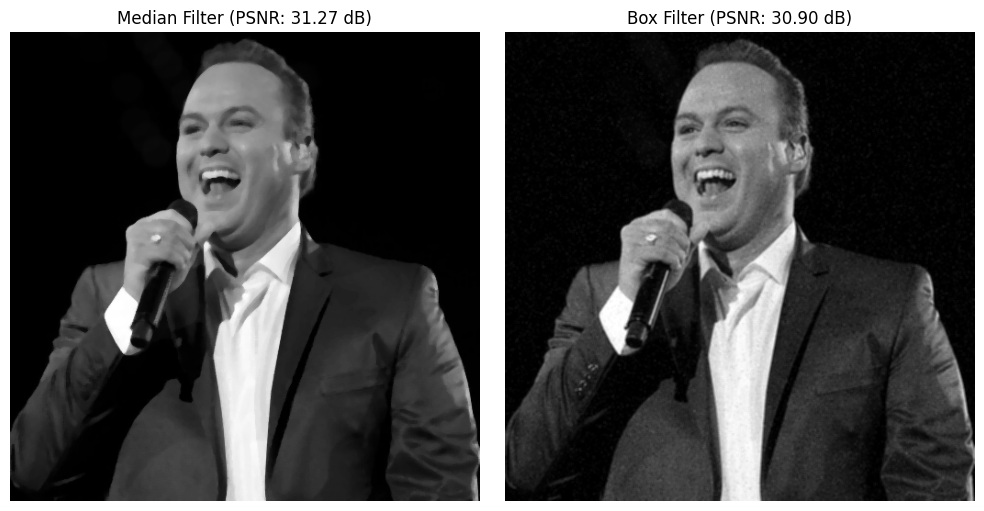

In [25]:
# load the images
frans_bauer_gaussian_image = cv2.imread("images/frans_bauer_gaussian.png", cv2.IMREAD_GRAYSCALE)
frans_bauer_image = cv2.imread("images/frans_bauer.png", cv2.IMREAD_GRAYSCALE)

# convert the image to float32 arrays
frans_bauer_gaussian = frans_bauer_gaussian_image.astype(np.float32)
frans_bauer = frans_bauer_image.astype(np.float32)

# denoise the image using different filtering methods
image_with_median_filter = denoise_image(frans_bauer_gaussian, 'median', 5)
image_with_box_filter = denoise_image(frans_bauer_gaussian, 'box', 3)

# calculate psnr for the images
median_psnr_value = calculate_psnr(frans_bauer, image_with_median_filter)
box_psnr_value = calculate_psnr(frans_bauer, image_with_box_filter)

# Create a figure to display the images
plt.figure(figsize=(15, 5))

# Display the image with median filter
plt.subplot(1, 3, 2)
plt.imshow(image_with_median_filter, cmap='gray')
plt.title(f'Median Filter (PSNR: {median_psnr_value:.2f} dB)')
plt.axis('off')

# Display the image with box filter
plt.subplot(1, 3, 3)
plt.imshow(image_with_box_filter, cmap='gray')
plt.title(f'Box Filter (PSNR: {box_psnr_value:.2f} dB)')
plt.axis('off')

plt.tight_layout()
plt.show()

<a id="section-5"></a>
### **Section 5: Edge Detection**

Edges in digital images represent areas where there is a significant change in brightness, often corresponding to the boundaries of objects. Detecting these edges is a crucial task in many computer vision applications, such as autonomous driving, where edge detection can be used to identify road boundaries and determine the vehicle's trajectory.

In this section, we will explore various techniques for edge detection, focusing specifically on filters that extract the gradient of the image. The gradient represents the rate of change in brightness and is calculated using first-order derivative filters. The Sobel operator, one of the most common methods, approximates the first derivative of a Gaussian filter and is used to detect edges by highlighting the intensity gradients in an image.

The Sobel operator uses two 3x3 convolution kernels, one for detecting changes in the horizontal direction (G_x) and the other for the vertical direction (G_y). The kernels are defined as follows:

$G_x = \begin{bmatrix} +1 & 0 & -1 \\ +2 & 0 & -2 \\ +1 & 0 & -1 \end{bmatrix} * \mathbf{I}$

$G_y = \begin{bmatrix} +1 & +2 & +1 \\ 0 & 0 & 0 \\ -1 & -2 & -1 \end{bmatrix} * \mathbf{I}$

The gradient magnitude, which combines the horizontal and vertical gradients, is given by:

$G =\sqrt {{G_x}^2+{G_y}^2}$

The direction of the gradient, indicating the orientation of the edge, is calculated as:

$\theta= \tan^{-1}\left(\frac{G_y}{G_x}\right)$

These calculations allow us to detect and quantify edges in an image. In this section, we will apply these methods to extract edges from images, with a particular focus on detecting roads in still images, which is a critical task in autonomous driving systems.

<a id="question-26"></a>
#### <font color='#FF0000'>Question 26 (4 points)</font>

Implement the function **compute_image_gradient()** to compute the gradients of an image. This function should calculate the gradients in both the x and y directions, as well as the gradient magnitude and direction.

You are not allowed to use Python built-in functions for computing gradients, but you may use the `scipy.signal.convolve2d` function for performing 2D convolution.

Additionally, complete the helper function **normalize_image()** to normalize the gradients.

In [26]:
def normalize_image(image: np.ndarray, low=0, high=1) -> np.ndarray:
    '''
    Normalizes the input image to a specified range [low, high].

    Args:
        image: The input image as a numpy array.
        low: The lower bound of the normalization range (default is 0).
        high: The upper bound of the normalization range (default is 1).

    Returns:
        normalized_image: The normalized image as a numpy array.
    '''

    # Convert the image to float32 for precision during normalization
    image = image.astype(np.float32)

    # Scale the image to [0, 1]:
    normalized_image = (image - np.min(image)) / (np.max(image) - np.min(image)) 

    # Stretch and shift the normalized values to the target range [low, high]
    normalized_image = normalized_image * (high - low) + low 
    
     # Return the normalized image
    return normalized_image

In [27]:
def compute_image_gradient(input_image: np.ndarray):
    '''
    Computes the gradients of the input image in both x and y directions,
    along with the gradient magnitude and direction.

    Args:
        input_image: The input image as a 2D numpy array.

    Returns:
        gradient_x: The gradient of the image in the x direction.
        gradient_y: The gradient of the image in the y direction.
        gradient_magnitude: The magnitude of the gradient.
        gradient_direction: The direction of the gradient (in degrees).
    '''

    # Sobel kernels for x and y directions
    sobel_x = [[1, 0, -1],
               [2, 0, -2],
               [1, 0, -1]]
    
    sobel_y = [[1, 2, 1],
               [0, 0, 0],
               [-1, -2, -1]]
    

    # Convolve the image with the Sobel kernels
    # 'same' ensures the output is the same size as the input
    # 'symm' reflects the border to handle edge pixels gracefully
    gradient_x = scipy.signal.convolve2d(input_image, sobel_x, mode='same', boundary='symm')
    gradient_y = scipy.signal.convolve2d(input_image, sobel_y, mode='same', boundary='symm')
    
    # Compute gradient magnitude using the Euclidean norm
    gradient_magnitude = np.sqrt(gradient_x**2 + gradient_y**2)

    # Compute gradient direction in radians, then convert to degrees
    # Add a small epsilon (1e-10) to denominator to prevent division by zero
    gradient_direction = np.arctan(gradient_y / (gradient_x + 1e-10)) * (180 / np.pi)  # Convert to degrees

    return normalize_image(gradient_x), normalize_image(gradient_y), gradient_magnitude, gradient_direction

<a id="question-27"></a>
#### <font color='#FF0000'>Question 27 (3 points)</font>

Using your implemented function **compute_image_gradient()** on `landscape.jpg`, display the following figures:

1. The gradient of the image in the x-direction.
2. The gradient of the image in the y-direction.
3. The gradient magnitude of each pixel.
4. The gradient direction of each pixel.

Discuss what kind of information each image conveys.

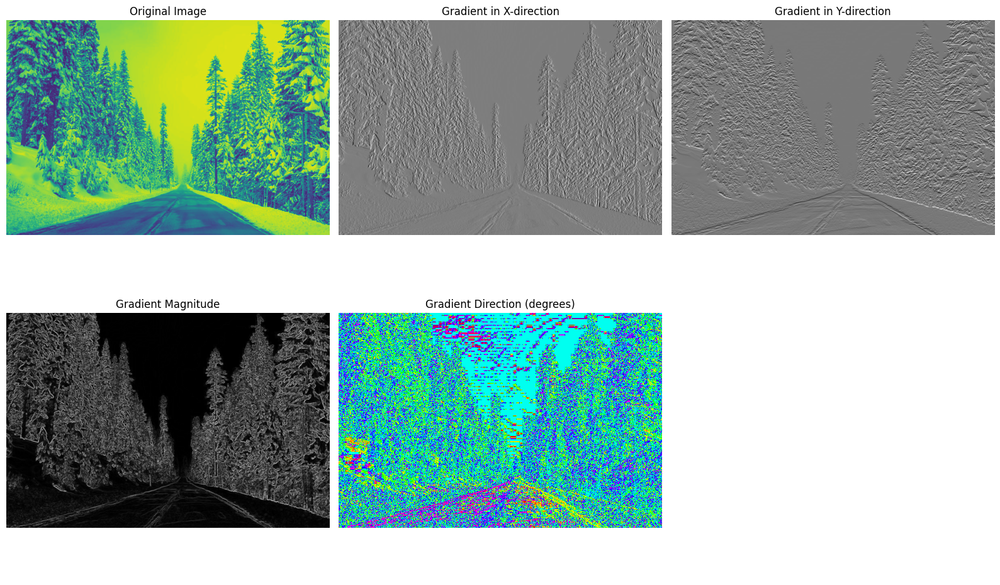

In [28]:
# Read the image in grayscale mode
image = cv2.imread('images/landscape.jpg', cv2.IMREAD_GRAYSCALE)

# Convert the image to float32 for processing
image_gray = image.astype(np.float32)

# Compute image gradients, magnitude, and direction
gradient_x, gradient_y, gradient_magnitude, gradient_direction = compute_image_gradient(image_gray)

# Plot the results
fig, axs = plt.subplots(2, 3, figsize=(16, 10))

# Display each image in the corresponding subplot
axs[0, 0].imshow(image_gray)
axs[0, 0].set_title('Original Image')
axs[0, 0].axis('off')

axs[0, 1].imshow(gradient_x, cmap='gray')
axs[0, 1].set_title('Gradient in X-direction')
axs[0, 1].axis('off')

axs[0, 2].imshow(gradient_y, cmap='gray')
axs[0, 2].set_title('Gradient in Y-direction')
axs[0, 2].axis('off')

axs[1, 0].imshow(gradient_magnitude, cmap='gray')
axs[1, 0].set_title('Gradient Magnitude')
axs[1, 0].axis('off')

axs[1, 1].imshow(gradient_direction, cmap='hsv')
axs[1, 1].set_title('Gradient Direction (degrees)')
axs[1, 1].axis('off')

axs[1, 2].axis('off')  # Empty subplot for layout

plt.tight_layout()
plt.show()

##### <font color='yellow'>Answer:</font>

The original image is the starting picture of a snowy forest road, containing all raw intensity information. However, edges and directions are not directly visible.

The second image shows the rate of change of pixel intensity along the horizontal axis, left to right. It corresponds to the partial derivative of the image w.r.t. x. Thus, places where the brightness changes sharply from left to right appear bright, such as the trunks of trees, which are emphasised since they create strong horizontal intensity changes. In contrast, flat or uniform regions, where brightness doesn't change left to right, appear dark.

The third image shows the rate of change of pixel intensity along the vertical axis, from up to down. That is, the partial derivate w.r.t. y. Thus, areas where brightness shifts suddenly from top to bottom appear bright. Thus, horizontal structures such as the road lines and top edges of trees against the sky are highlighted. In contrast, regions with little vertical variation appear dark.

The fourth image, or the first in the second row, combines the x and y gradients into a single measure using the magnitude formula. Thus, it shows the strength of edges regardless of direction. Strong edges (either vertical, horizontal, or diagonal) appear very bright. Hence, the trees, road, and sky are outlined very clearly. Flat regions with little change in brightness are, in contrast, dark.

Lastly, the fifth image shows the orientation of the edges, with the angles mapped into colours. Thus, each hue corresponds to a different direction of edge. For example, vertical edges may be shown in one colour, while horizontal and diagonal in another. Therefore, the image encodes both the presence of edges and the way in which they are pointing.

<a id="question-28"></a>
#### <font color='#FF0000'>Question 28 (4 points)</font>

Compared to the Sobel filter, a Laplacian of Gaussian (LoG) relies on the second derivative of a Gaussian filter. Hence, it will focus on large gradients in the image.

Implement the function **compute_laplacian_of_gaussian()** to compute the Laplacian of Gaussian (LoG) for an image using each the following methods:

1. Smoothing the image with a Gaussian kernel, then applying the Laplacian (second derivative) to the smoothed image.
2. Convolving the image directly with a LoG kernel.
3. Computing the Difference of Gaussians (DoG) at different scales $\sigma_1$ and $\sigma_2$.

The function should take arguments *method*, *kernel_size*, *sigma*, *sigma_1*, and *sigma_2* to specify the parameters for each method.

**Note:** You are not allowed to use Python built-in functions for computing LoG kernels, but you can use `scipy.signal.convolve2d` for 2D convolution.

In [29]:
def compute_laplacian_of_gaussian(image, method, kernel_size=5, sigma=0.5, sigma_1=0.5, sigma_2=1.0):
    '''
    Computes the Laplacian of Gaussian (LoG) using the specified method.

    Args:
        image: Input image as a 2D numpy array.
        method: Specifies which method to use (1, 2, or 3).
        kernel_size: Size of the Gaussian kernel (default is 5).
        sigma: Standard deviation of the Gaussian for methods 1 and 2 (default is 0.5).
        sigma_1: Standard deviation of the first Gaussian for method 3 (default is 0.5).
        sigma_2: Standard deviation of the second Gaussian for method 3 (default is 1.0).

    Returns:
        log_image: The resulting image after applying the Laplacian of Gaussian.
    '''

    laplacian_kernel = np.array([[0, -1, 0],
                                 [-1, 4, -1],
                                 [0, -1, 0]])

    if method == 1:
        # Method 1: Gaussian smoothing followed by the Laplacian
        gauss = gaussian_kernel_2D(sigma, sigma, kernel_size)
        smoothed = scipy.signal.convolve2d(image, gauss, mode='same', boundary='symm')
        log_image = scipy.signal.convolve2d(smoothed, laplacian_kernel, mode='same', boundary='symm')

    elif method == 2:
        # Method 2: Direct convolution with a LoG kernel
        gauss = gaussian_kernel_2D(sigma, sigma, kernel_size)
        log_kernel = scipy.signal.convolve2d(gauss, laplacian_kernel, mode='same', boundary='symm')
        log_image = scipy.signal.convolve2d(image, log_kernel, mode='same', boundary='symm')
        
    elif method == 3:
        # Method 3: Difference of Gaussians (DoG)
        gauss1 = gaussian_kernel_2D(sigma_1, sigma_1, kernel_size)
        gauss2 = gaussian_kernel_2D(sigma_2, sigma_2, kernel_size)
        dog_kernel = gauss1 - gauss2
        log_image = scipy.signal.convolve2d(image, dog_kernel, mode='same', boundary='symm')

    else:
        raise ValueError("Invalid method. Choose 1, 2, or 3.")

    return log_image

<a id="question-29"></a>
#### <font color='#FF0000'>Question 29 (1 point)</font>

Test your **compute_laplacian_of_gaussian()** function using `landscape.jpg` and visualize your results using the three methods. Use the default parameters provided for each method.

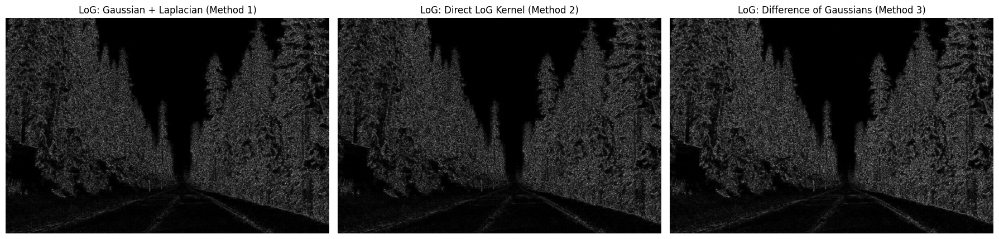

In [30]:
# Import image in grayscale
image = cv2.imread('images/landscape.jpg', cv2.IMREAD_GRAYSCALE)

# Convert image to float32 for numerical stability in filtering
image = image.astype(np.float32)

# Compute Laplacian of Gaussian (LoG) using three different methods
log1 = compute_laplacian_of_gaussian(image, method=1)
log2 = compute_laplacian_of_gaussian(image, method=2)
log3 = compute_laplacian_of_gaussian(image, method=3)

# --- Helper function to normalize images for better display ---
def normalize_image(img):
    """
    Normalize image values to range [0, 1] for visualization.
    This makes faint edges more visible and improves contrast.
    """
    img = np.abs(img)             # Take absolute value (to capture both edge polarities)
    img = img - img.min()         # Shift values so min = 0
    if img.max() != 0:
        img = img / img.max()     # Scale so max = 1
    return img

# Normalize each LoG result
log1_disp = normalize_image(log1)
log2_disp = normalize_image(log2)
log3_disp = normalize_image(log3)

# Set up a figure with 1 row and 3 columns for comparison
fig, axs = plt.subplots(1, 3, figsize=(18, 6))

# Display results of Method 1
axs[0].imshow(log1_disp, cmap='gray')
axs[0].set_title('LoG: Gaussian + Laplacian (Method 1)')
axs[0].axis('off')

# Display results of Method 2
axs[1].imshow(log2_disp, cmap='gray')
axs[1].set_title('LoG: Direct LoG Kernel (Method 2)')
axs[1].axis('off')

# Display results of Method 3
axs[2].imshow(log3_disp, cmap='gray')
axs[2].set_title('LoG: Difference of Gaussians (Method 3)')
axs[2].axis('off')

# Adjust layout so titles and images don’t overlap
plt.tight_layout()
plt.show()


<a id="question-30"></a>
#### <font color='#FF0000'>Question 30 (2 points)</font>

Discuss the differences between applying the three methods of the Laplacian of Gaussian (LoG) on `landscape.jpg`. Consider how each method approaches edge detection and the visual results produced by each technique.

##### <font color='yellow'>Answer:</font>

The three methods all aim to compute the Laplacian of Gaussian (LoG), but they differ in how smoothing and Laplacian are combined:

The first method smooths the image with a Gaussian kernel first, then applies a discrete Laplacian kernel. Because of this two-step approach, noise gets reduced before edge detection, so the results look cleaner but also a bit blurrier. Fine details or very sharp edges can get softened, though the main edges are still clear enough.

The second method makes a LoG kernel directly by combining the Gaussian and the Laplacian, and then applies it to the image in one go. This gives a more exact version of LoG, so the edges come out sharper and more precise compared to the first method. The downside is that it’s more sensitive to the choice of kernel size and sigma, and sometimes you see a bit more noise or thinner edges.

The third method takes two Gaussians with different sigmas, subtracts them, and uses that as the kernel. It’s a cheaper way of approximating LoG and works well to capture edges at different scales. The results aren’t exactly the same as a “true” LoG, since edges in the mid-range tend to stand out more, while very small details or very broad changes in brightness might not be picked up as much. Visually it looks more like a band-pass filter, giving strong responses to certain sized edges but not all of them.

In terms of visual differences, I cannot spot any with the naked eye.

<a id="question-31"></a>
#### <font color='#FF0000'>Question 31 (2 points)</font>

In the first method, why is it important to convolve an image with a Gaussian before convolving with a Laplacian?

##### <font color='yellow'>Answer:</font>

Because the Laplacian is a second derivative operator. Therefore, it is very sensitive to noise in the image. If you apply it directly, even small fluctuations in intensity will produce strong responses, leading to noisy and fragmented edges. Convolving with a Gaussian first smooths the image, reducing high-frequency noise and small variations, so that the Laplacian responds mainly to meaningful intensity changes (true edges) instead of random noise. This combination ensures more stable and reliable edge detection.

Also, the Gaussian introduces a scale parameter (σ) that controls how much smoothing is applied. This means you can adjust the operator to detect edges at different levels of detail: small σ emphasizes fine edges, while larger σ highlights broader structures. Without this smoothing step, the Laplacian would detect everything to similar extents, making the result visually cluttered.

<a id="question-32"></a>
#### <font color='#FF0000'>Question 32 (2 points)</font>

In the third method, what is the best ratio between $\sigma_1$ and $\sigma_2$ to achieve the best approximation of the LoG? What is the purpose of having two different standard deviations?

**Hint**: The best approximation for our case is found when both $\sigma_1$ and $\sigma_2$ are within the range of 1 to 10.


Best DoG approximation to LoG:
σ1 = 1.0, σ2 = 10.0, MSE = 2123.353157


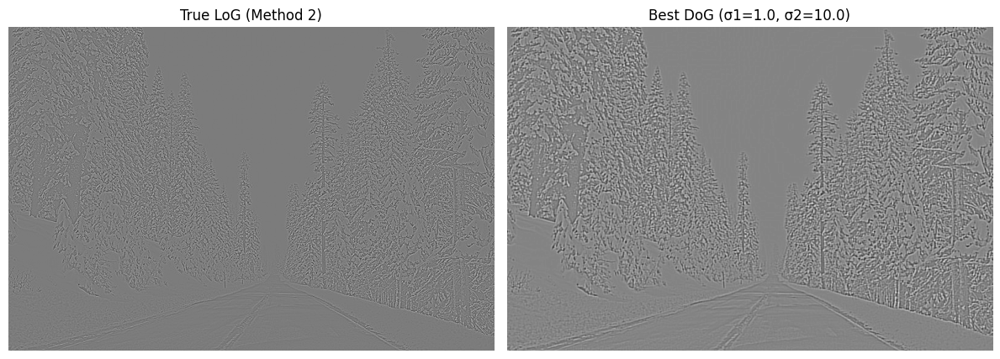

In [ ]:
# Import image in grayscale
image = cv2.imread('images/landscape.jpg', cv2.IMREAD_GRAYSCALE)

# Convert image to float32 for numerical stability in filtering
image = image.astype(np.float32)

# Compute reference LoG using Method 2 (closest to the "true" Laplacian of Gaussian)
log_image = compute_laplacian_of_gaussian(image, method=2)

# Define range and step size for sigma values
step = 0.1
sigma_values = np.arange(1.0, 10.1, step)   # from 1.0 to 10.0, step 0.1

# Container to store results for later comparison
results = []

# Loop through sigma_1 values
for i, sigma_1 in enumerate(sigma_values):
    # Start sigma_2 from the next possible value (sigma_1 + step)
    for sigma_2 in sigma_values[i+1:]:
        # Compute LoG approximation using Method 3 (Difference of Gaussians)
        log_dog = compute_laplacian_of_gaussian(
            image, method=3, sigma_1=sigma_1, sigma_2=sigma_2
        )

        # Compute similarity/error metric against reference LoG
        mse = np.mean((log_image - log_dog) ** 2)

        # Store (sigma_1, sigma_2, error value)
        results.append((sigma_1, sigma_2, mse))

# Convert results into a structured NumPy array for easy sorting/analysis
results = np.array(results, dtype=[('sigma_1', float), ('sigma_2', float), ('mse', float)])

# Sort results by error (lower MSE = better approximation)
results_sorted = np.sort(results, order='mse')

# Best (lowest error) sigma_1, sigma_2 combination
best_sigma_1, best_sigma_2, best_mse = results_sorted[0]
print(f"\nBest DoG approximation to LoG:")
print(f"sigma1 = {best_sigma_1:.1f}, sigma2 = {best_sigma_2:.1f}, MSE = {best_mse:.6f}")

##### <font color='yellow'>Answer:</font>

The Difference of Gaussians (DoG) uses two different standard deviations because subtracting two blurred versions of an image isolates structures that exist between those two scales, effectively creating a band-pass filter. This operation approximates the Laplacian of Gaussian (LoG), since the difference of two Gaussians with close $\sigma$ values converges to the second derivative. In practice, this makes DoG efficient for edge and blob detection, as it highlights features at specific spatial frequencies while avoiding the heavier computation of applying the LoG directly.

<a id="question-33"></a>
#### <font color='#FF0000'>Question 33 (2 points)</font>

What else is needed to improve the performance and isolate the road? You don't have to provide any specific parameter or algorithm. Propose a direction that would be interesting to explore and explain how you would approach it.

##### <font color='yellow'>Answer:</font>

One way to improve performance and better isolate the road is to increase the value of σ in the Gaussian. A larger σ smooths out fine textures such as trees and grass, while preserving broader structures like the road, so the LoG response emphasizes large, continuous edges rather than small clutter. Also, performance could also be enhanced by combining LoG with segmentation or morphological filtering, or by using structural constraints (e.g., Hough transform for road boundaries), but the main improvement comes from tuning σ to highlight edges at the right scale.

<a id="section-6"></a>
### **Section 6: Foreground-background separation**

Foreground-background separation is a crucial task in the field of computer vision, enabling applications such as object recognition, scene understanding, and image editing. The objective is to distinguish the main object (foreground) from the surrounding area (background) in an image. This process is essential when the foreground object needs to be isolated for further analysis or processing.

In this section, we will implement a simple unsupervised algorithm that leverages texture variations to segment the foreground object from the background. The assumption is that the foreground object has a distinct combination of textures compared to the background, which can be exploited for separation.

Gabor filters, known for their effectiveness in capturing texture information due to their frequency domain characteristics, will be used to analyze the texture differences within the image. By applying a collection of Gabor filters with varying scales and orientations—referred to as a *filter bank*—we can effectively distinguish between different texture patterns in the image.

In the example below, you can see how this process works. The **left** image shows the original input image. The **middle** image displays the foreground mask, which identifies the pixels that belong to the foreground object. The **right** image shows the result of applying the foreground mask to the input image, effectively isolating the foreground object from the background.

<img src="https://drive.google.com/thumbnail?id=1N4hExtMIiMxM03OK4iHKURTvSibccEwd&sz=w1000">

See the outline of the algorithm below:

---

**Foreground-Background Segmentation Algorithm**

---

**Input:** $x$ - input image

**Output:** $y$ - pixelwise labels

1.   Convert to grayscale if necessary.

>**if** $x$ is RGB **then**

>>$x$ $\leftarrow$ rgb2gray($x$)

>**end if**

2.   Create Gabor filterbank, $\mathcal{F}_{gabor}$, with varying $\sigma$, $\lambda$ and $\theta$.

3.   Filter $x$ with the filterbank. Store each output in $fmaps$.

4.   Compute the magnitude of the complex $fmaps$. Store the results in $fmags$.

>$fmags$ $\leftarrow$  $\vert fmaps \vert$

5.   Smooth $fmags$.

>$fmags$ $\leftarrow$  smooth($fmags$)

6.   Convert $fmags$ into data matrix, $f$.

>$f$ $\leftarrow$  reshape($fmags$)

7.   Cluster $f$ using kmeans into two sets.

>$y$ $\leftarrow$  kmeans($f$, 2)

---

<a id="question-33"></a>
#### <font color='#FF0000'>Question 33 (7 points)</font>

Please get familiar with the provided skeleton code below. You will need your implementation of the **create_gabor()** function. When you successfully implement all functions, the code should run without problems and produce a reasonable segmentation with the default parameters on **kobi.png**.

In [32]:
def load_image(image_id="kobi"):
    '''
    Load an image, resize it, and set the correct color representation.

    Args:
        image_id: ID of the image (default is "kobi")

    Returns:
        image: Loaded and processed image
    '''
    if image_id == 'clownfish':
        image = cv2.imread('./images/clownfish.jpg')
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    elif image_id == 'flower':
        image = cv2.imread('./images/flower.jpg')
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    elif image_id == 'kobi':
        image = cv2.imread('./images/kobi.png')
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    elif image_id == 'landscape':
        image = cv2.imread('./images/landscape.jpg')
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    elif image_id == 'polar_bear_hiding':
        image = cv2.imread('./images/polar_bear_hiding.jpg')
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    elif image_id == 'robin':
        image = cv2.imread('./images/robin.jpg')
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    elif image_id == 'swan':
        image = cv2.imread('./images/swan.jpg')
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    else:
        raise ValueError('Image not available.')

    return image

In [33]:
def show_image(image, title="Kobi", colormap='gray'):
    '''
    Display an image in grayscale.

    Args:
        image: Image to be displayed
        title: Title for the image (default is "Kobi")
        colormap: Colormap used by matplotlib (default is 'gray')
    '''
    plt.figure()
    plt.title(title)
    plt.imshow(image, cmap=colormap)
    plt.axis("off")

In [34]:
### Foreground-Background Segmentation Algorithm
### Part 0 - Read Image and Convert to Grayscale

def preprocess_image(image_id="kobi"):
    '''
    Load an image, resize it, and convert it to grayscale if necessary.

    Args:
        image_id: ID of the image to load (default is "Kobi")

    Returns:
        grayscale_image: Grayscale image
    '''
    # Load the image
    image = load_image(image_id)
    show_image(image)

    # Check if the image is grayscale or RGB
    # YOUR CODE HERE
    # if the image is RGB, convert it to grayscale
    if len(image.shape) == 3 and image.shape[2] == 3:
        grayscale_image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    else:
        grayscale_image = image

    # normalize the grayscale image to the range [0, 1]
    grayscale_image = grayscale_image.astype(np.float32) / 255.0

    # show the grayscale image for verification
    show_image(grayscale_image, title="Kobi grayscale")

    return grayscale_image

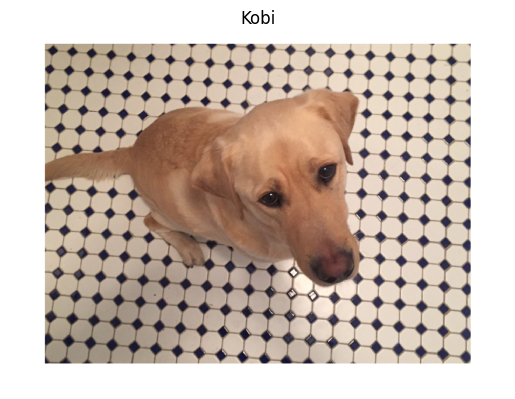

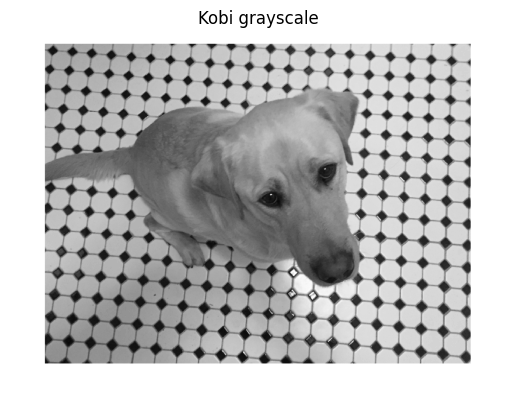

In [35]:
grayscale_image = preprocess_image(image_id="kobi")

In [36]:
def create_gabor_filter_bank(image, sigmas=None, orientations=None):
    '''
    Create a Gabor filter bank with varying scales and orientations.

    Args:
        image: Grayscale input image
        # ADDED FOR LATER EXERCISE
        sigmas: List of standard deviations for the Gaussian envelope
        orientations: List of orientations in radians for the Gaussian envelope

    Returns:
        gabor_filter_bank: A list of dictionaries containing Gabor filters and their parameters
    '''
    num_rows, num_cols = image.shape

    # Estimate the minimum and maximum wavelengths for the sinusoidal carriers
    lambda_min = 4 / np.sqrt(2)
    lambda_max = np.sqrt(np.abs(num_rows) ** 2 + np.abs(num_cols) ** 2)

    # Specify the carrier wavelengths
    n = np.floor(np.log2(lambda_max / lambda_min))
    lambdas = 2 ** np.arange(0, (n - 2) + 1) * lambda_min

    # Define the set of orientations for the Gaussian envelope (Thetas)
    delta_theta = np.pi / 4.0
    if orientations is None:
        orientations = np.arange(0, np.pi + delta_theta, delta_theta)

    # Define the set of sigmas for the Gaussian envelope (spread of the Gaussian)
    if sigmas is None:
        sigmas = np.array([1, 2])

    gabor_filter_bank = []
    start_time = time.time()

    # Total number of features
    n_features = len(lambdas) * len(sigmas) * len(orientations)

    with tqdm(total=n_features) as pbar:

        # Generate Gabor filters for each combination of wavelength, sigma, and orientation
        for wavelength in lambdas:
            for sigma in sigmas:
                for theta in orientations:
                    # Filter parameter configuration
                    psi = 0
                    gamma = 0.5

                    # Create a Gabor filter with the specified parameters
                    filter_config = {}
                    filter_config["filter_pairs"] = create_gabor(sigma, theta, wavelength, psi, gamma)
                    filter_config["sigma"] = sigma
                    filter_config["wavelength"] = wavelength
                    filter_config["theta"] = theta
                    filter_config["psi"] = psi
                    filter_config["gamma"] = gamma

                    # Append the filter configuration to the filter bank
                    gabor_filter_bank.append(filter_config)

                    # Update the progress bar
                    pbar.update(1)

    creation_time = time.time() - start_time
    
    # Print details about the created filter bank
    print(f'Total number of filters: {len(gabor_filter_bank)}')
    print(f'Number of scales (sigma): {len(sigmas)}')
    print(f'Number of orientations (theta): {len(orientations)}')
    print(f'Number of carriers (lambda): {len(lambdas)}')
    print(f'\nFilter bank created in {creation_time} seconds.')

    return gabor_filter_bank

In [37]:
gabor_filter_bank = create_gabor_filter_bank(grayscale_image)

100%|██████████| 80/80 [00:00<00:00, 10004.90it/s]

Total number of filters: 80
Number of scales (sigma): 2
Number of orientations (theta): 5
Number of carriers (lambda): 8

Filter bank created in 0.012996673583984375 seconds.


In [38]:
### Foreground-Background segmentation algoritm
### Part 2 - gabor features fMaps and fMags

def extract_gabor_features(image, gabor_filter_bank, visualize=False):
    '''
    Filter images using the Gabor filter bank with quadrature pairs (real and imaginary parts).

    Args:
        image: Grayscale input image
        gabor_filter_bank: A list of dictionaries containing Gabor filters and their parameters
        visualize: Flag to visualize filter responses (default is False)

    Returns:
        feature_magnitudes: List of magnitude responses for each Gabor filter
    '''
    feature_maps = []

    with tqdm(total=len(gabor_filter_bank)) as pbar:

        for gabor_filter in gabor_filter_bank:
            # Filter the image with the real and imaginary parts of the Gabor filter

            real_output = None
            imaginary_output = None

            # YOUR CODE HERE
            real_output = cv2.filter2D(image, cv2.CV_32F, gabor_filter["filter_pairs"][:, :, 0])
            imaginary_output = cv2.filter2D(image, cv2.CV_32F, gabor_filter["filter_pairs"][:, :, 1])

            # Append the real and imaginary parts to the list of feature maps
            feature_maps.append(np.stack((real_output, imaginary_output), 2))

            # Update the progress bar
            pbar.update(1)

            # Visualize the filter responses if requested
            if visualize:
                fig = plt.figure()
                ax = fig.add_subplot(1, 2, 1)
                ax.imshow(real_output, cmap='gray')
                ax.set_title(f'Real Part, λ={gabor_filter["wavelength"]:.4f}, θ={gabor_filter["theta"]:.4f}, σ={gabor_filter["sigma"]:.4f}')
                ax.axis("off")

                ax = fig.add_subplot(1, 2, 2)
                ax.imshow(imaginary_output, cmap='gray')
                ax.set_title(f'Imaginary Part, λ={gabor_filter["wavelength"]:.4f}, θ={gabor_filter["theta"]:.4f}, σ={gabor_filter["sigma"]:.4f}')
                ax.axis("off")
                plt.show()

    # Compute the magnitude of the output responses
    feature_magnitudes = []

    with tqdm(total=len(feature_maps)) as pbar:
    
        for i, feature_map in enumerate(feature_maps):

            # Compute the magnitude of the feature map
            # YOUR CODE HERE
            magnitude = np.sqrt(np.square(feature_map[:, :, 0]) + np.square(feature_map[:, :, 1]))
            feature_magnitudes.append(magnitude)

            # Update the progress bar
            pbar.update(1)

            # Visualize the magnitude response if requested
            if visualize:
                plt.figure()
                plt.imshow(magnitude.astype(np.uint8), cmap='gray')
                plt.title(f'Magnitude, λ={gabor_filter_bank[i]["wavelength"]:.4f}, θ={gabor_filter_bank[i]["theta"]:.4f}, σ={gabor_filter_bank[i]["sigma"]:.4f}')
                plt.axis("off")
                plt.show()

    print(f'Created {len(feature_magnitudes)} features for each pixel')
    return feature_magnitudes

In [39]:
feature_magnitudes = extract_gabor_features(grayscale_image, gabor_filter_bank)

100%|██████████| 80/80 [00:00<00:00, 120.48it/s]


Created 80 features for each pixel


In [40]:
### Foreground-Background segmentation algoritm
### Part 3 - cluster features in two sets

def cluster_features(image, feature_magnitudes, apply_smoothing=True):
    '''
    Cluster pixels based on their Gabor feature magnitudes.

    Hint: To standardize the features, you can use the following web page: https://www.analyticsvidhya.com/blog/2020/04/feature-scaling-machine-learning-normalization-standardization/

    Args:
        image: Grayscale input image
        feature_magnitudes: List of magnitude responses for each Gabor filter
        apply_smoothing: Flag to apply Gaussian smoothing (default is True)

    Returns:
        pixel_labels: Cluster labels for each pixel
    '''
    num_rows, num_cols = image.shape
    features = np.zeros(shape=(num_rows, num_cols, len(feature_magnitudes)))

    if apply_smoothing:
        # Apply Gaussian smoothing to each feature magnitude
        # YOUR CODE HERE
        for i, feature_magnitude in enumerate(feature_magnitudes):
            feature_magnitude = feature_magnitude.astype(np.float32)
            smoothed_magnitude = cv2.GaussianBlur(feature_magnitude, ksize=(5, 5), sigmaX=1.0, sigmaY=1.0, borderType=cv2.BORDER_REFLECT)
            features[:, :, i] = smoothed_magnitude

    else:
        # Directly insert magnitude images into the features matrix
        for i, feature_magnitude in enumerate(feature_magnitudes):
            features[:, :, i] = feature_magnitude

    # Reshape the features matrix to prepare for clustering
    features = np.reshape(features, newshape=(num_rows * num_cols, -1))

    # Standardize the features   
    # YOUR CODE HERE
    # set a zero mean and unit variance for each feature
    features_mean = np.mean(features, axis=0)
    features_std = np.std(features, axis=0) + 1e-8
    features = (features - features_mean) / features_std

    start_time = time.time()

    # Apply k-means clustering
    # YOUR CODE HERE
    kmeans = KMeans(n_clusters=2, random_state=0, n_init=10)
    pixel_labels = kmeans.fit_predict(features)
    pixel_labels = pixel_labels.reshape((num_rows, num_cols))

    print(f'Clustering completed in {time.time() - start_time} seconds.')

    return pixel_labels

In [41]:
pixel_labels = cluster_features(grayscale_image, feature_magnitudes, apply_smoothing=True)

Clustering completed in 10.505630493164062 seconds.


In [42]:
### Foreground-Background segmentation algorithm
### Part 4 - Visualise result

def visualize_clustering_results(image, pixel_labels):
    '''
    Visualize the clustering results and segmentation.

    Args:
        image: Grayscale input image
        pixel_labels: Cluster labels for each pixel

    Returns:
        None
    '''
    num_rows, num_cols = image.shape
    pixel_labels = np.reshape(pixel_labels, newshape=(num_rows, num_cols))

    # Visualize pixel clusters
    plt.figure()
    plt.title('Pixel Clusters')
    plt.imshow(pixel_labels)
    plt.axis("off")
    plt.show()

    # Use pixel labels to visualize segmentation
    segmented_image1 = np.zeros_like(image)
    segmented_image2 = np.zeros_like(image)

    # YOUR CODE HERE
    binary_mask = pixel_labels == 0 # Check for the value of your labels in pixel_labels (could be 1 or 2 instead of 0)

    segmented_image1[binary_mask] = image[binary_mask]
    segmented_image2[~binary_mask] = image[~binary_mask]

    plt.figure()
    plt.title('Montage')
    plt.imshow(segmented_image1, cmap='gray', interpolation='none')
    plt.imshow(segmented_image2, cmap='jet', interpolation='none', alpha=0.7)
    plt.axis("off")
    plt.show()

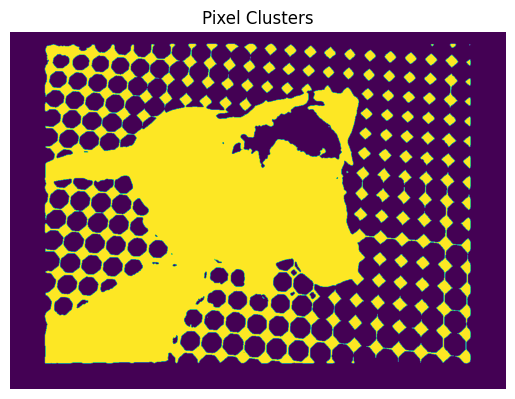

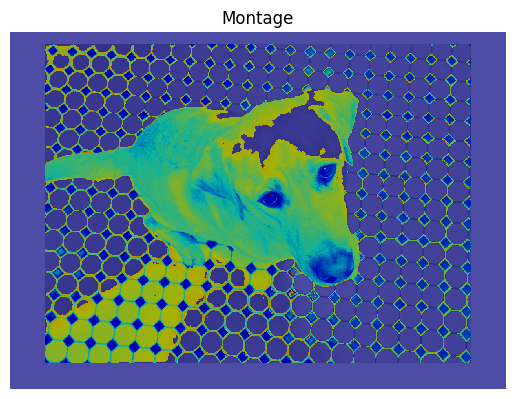

In [43]:
# Visualize the results
visualize_clustering_results(grayscale_image, pixel_labels)

<a id="question-34"></a>
#### <font color='#FF0000'>Question 34 (7 points)</font>

Implement the `foreground_background_separation()` function using Gabor filters. Complete the function provided and experiment with different images (`clownfish`, `flower`, `kobi`, `polar_bear_hiding`, `robin` **and** `swan`) using the default parameters.

Make sure to visualize the results using four subplots: the original image, the pixel representation projected onto the first principal component, the pixel clusters, and the montage showing segmentation. 

After visualizing the results, observe how the `sigmas` and `orientations` parameters influence the foreground-background separation. Describe your observations, focusing on the effectiveness of the separation and any patterns or trends you notice.

In [44]:
def foreground_background_separation(image, sigmas, orientations, apply_smoothing=True):
    '''
    Perform foreground-background segmentation using Gabor filters.

    Args:
        image: Grayscale input image
        sigmas: List of sigmas for the Gaussian envelope
        orientations: List of orientations for the Gabor filters
        apply_smoothing: Flag to apply Gaussian smoothing to magnitude images (default is True)

    Returns:
        None
    '''
    # create Gabor filter bank using earlier function
    gabor_filter_bank = create_gabor_filter_bank(image, sigmas=sigmas, orientations=orientations)

    # extract Gabor features using earlier function
    feature_magnitudes = extract_gabor_features(image, gabor_filter_bank, visualize=False)

    # cluster features using earlier function
    pixel_labels = cluster_features(image, feature_magnitudes, apply_smoothing=apply_smoothing)

    # PCA(1) projection of features for visualization
    D = len(feature_magnitudes)
    H, W = image.shape
    feats = np.zeros((H, W, D), dtype=np.float32)
    for i, m in enumerate(feature_magnitudes):
        feats[:, :, i] = m.astype(np.float32)

    X = feats.reshape(H*W, D)
    
    # standardize per-feature for PCA
    mu = X.mean(axis=0, keepdims=True)
    sd = X.std(axis=0, keepdims=True) + 1e-8
    Xz = (X - mu) / sd

    pca = PCA(n_components=1, random_state=0)
    pc1 = pca.fit_transform(Xz).reshape(H, W)
    pc1_disp = (pc1 - pc1.min()) / (pc1.max() - pc1.min() + 1e-8)

    # use new visualization to show the 4 subplots
    fig, axs = plt.subplots(1, 4, figsize=(20, 5))

    # original image
    axs[0].imshow(image, cmap='gray')
    axs[0].set_title('Original Image')
    axs[0].axis('off')

    # pixel representation onto the first principal component
    axs[1].imshow(pc1_disp, cmap='gray')
    axs[1].set_title('Pixel Representation onto the First Principal Component')
    axs[1].axis('off')

    # pixel clusters
    axs[2].imshow(pixel_labels, cmap='gray')
    axs[2].set_title('Pixel Clusters')
    axs[2].axis('off')  

    # montage
    segmented_image1 = np.zeros_like(image)
    segmented_image2 = np.zeros_like(image)
    binary_mask = pixel_labels == 0
    segmented_image1[binary_mask] = image[binary_mask]
    segmented_image2[~binary_mask] = image[~binary_mask]
    axs[3].imshow(segmented_image1, cmap='gray', interpolation='none')
    axs[3].imshow(segmented_image2, cmap='jet', interpolation='none', alpha=0.7)
    axs[3].set_title('Montage')
    axs[3].axis('off')

    plt.tight_layout()
    plt.show()

100%|██████████| 70/70 [00:00<00:00, 8752.20it/s]


Total number of filters: 70
Number of scales (sigma): 2
Number of orientations (theta): 5
Number of carriers (lambda): 7

Filter bank created in 0.01096963882446289 seconds.


100%|██████████| 70/70 [00:00<00:00, 650.42it/s]


Created 70 features for each pixel
Clustering completed in 1.1333074569702148 seconds.


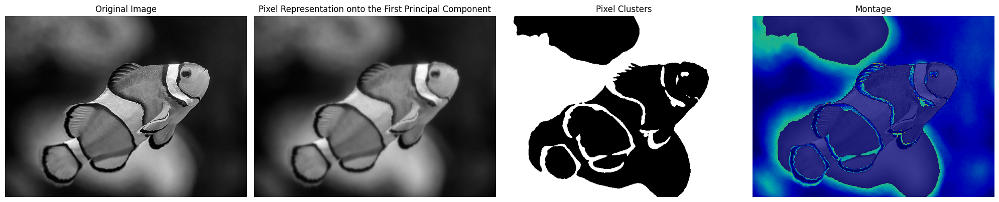

100%|██████████| 70/70 [00:00<00:00, 7776.69it/s]


Total number of filters: 70
Number of scales (sigma): 2
Number of orientations (theta): 5
Number of carriers (lambda): 7

Filter bank created in 0.011003255844116211 seconds.


100%|██████████| 70/70 [00:00<00:00, 635.14it/s]


Created 70 features for each pixel
Clustering completed in 1.067187786102295 seconds.


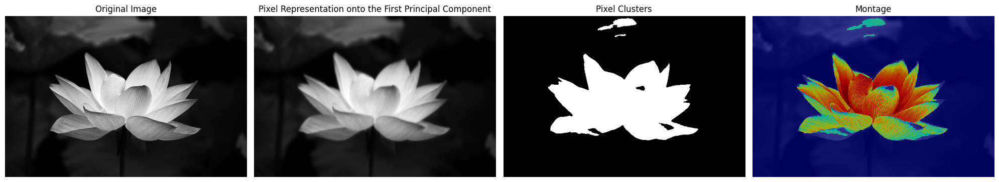

100%|██████████| 80/80 [00:00<00:00, 2846.44it/s]


Total number of filters: 80
Number of scales (sigma): 2
Number of orientations (theta): 5
Number of carriers (lambda): 8

Filter bank created in 0.030933380126953125 seconds.


100%|██████████| 80/80 [00:00<00:00, 93.13it/s] 


Created 80 features for each pixel
Clustering completed in 7.706390857696533 seconds.


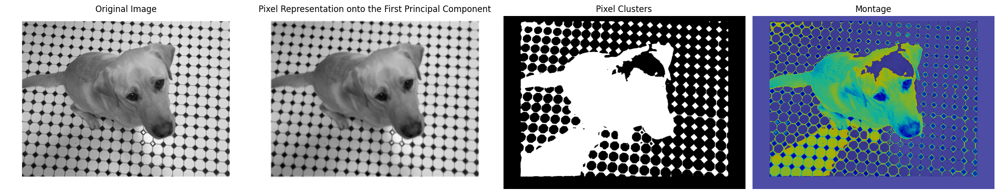

100%|██████████| 60/60 [00:00<00:00, 3236.43it/s]


Total number of filters: 60
Number of scales (sigma): 2
Number of orientations (theta): 5
Number of carriers (lambda): 6

Filter bank created in 0.0225374698638916 seconds.


100%|██████████| 60/60 [00:00<00:00, 1331.16it/s]


Created 60 features for each pixel
Clustering completed in 0.5333750247955322 seconds.


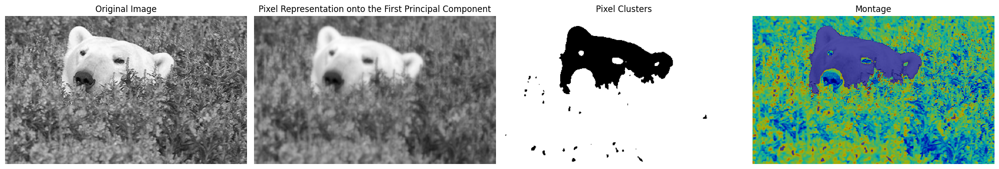

100%|██████████| 70/70 [00:00<00:00, 1425.65it/s]


Total number of filters: 70
Number of scales (sigma): 2
Number of orientations (theta): 5
Number of carriers (lambda): 7

Filter bank created in 0.05811429023742676 seconds.


100%|██████████| 70/70 [00:00<00:00, 196.28it/s]


Created 70 features for each pixel
Clustering completed in 2.8124001026153564 seconds.


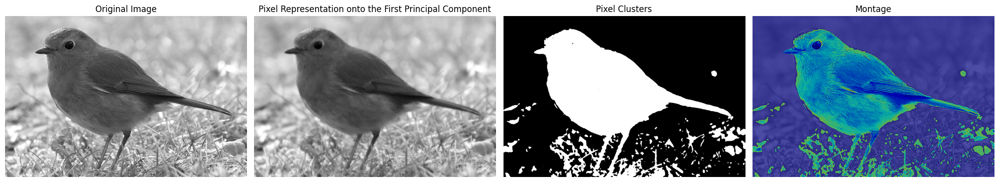

100%|██████████| 70/70 [00:00<00:00, 4750.75it/s]


Total number of filters: 70
Number of scales (sigma): 2
Number of orientations (theta): 5
Number of carriers (lambda): 7

Filter bank created in 0.016732215881347656 seconds.


100%|██████████| 70/70 [00:00<00:00, 217.42it/s]


Created 70 features for each pixel
Clustering completed in 2.3584485054016113 seconds.


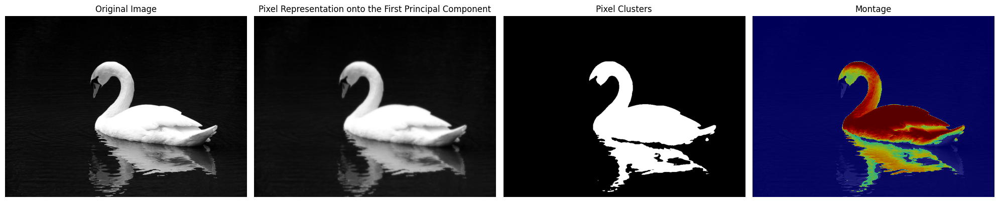

In [45]:
# Control settings
delta_theta = 2 * np.pi / 8  # Step size for orientations
orientations = np.arange(0, np.pi + delta_theta, delta_theta)
sigmas = np.array([1.0, 2.0])
apply_smoothing = True

image_names = [
    "clownfish",
    "flower",
    "kobi",
    "polar_bear_hiding",
    "robin",
    "swan"
]

# Loop through each image, load it, and apply foreground-background separation
for image_name in image_names:
    # Load the image
    image = load_image(image_name)
    
    # Convert the image to grayscale
    image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    
    # Perform foreground-background separation
    foreground_background_separation(image, sigmas, orientations, apply_smoothing)

##### <font color='yellow'>Answer:</font>

> After implementing and analysing the images, and changing the sigmas and orientations a little bit, it can be seen how these parameters influence the results:<br>
> A lower sigma is used for finding the finer textures and details in the images, but is more sensitave to noise. A high sigma finds bigger structures, but because of that might lose the fine details. A mix of sigmas is neccesary to seperate the image good, finding the details, but not the noise.<br>
> For the orientation, it can be seen that with more orientations, the rotation invariance is better, meaning that specific features in the images that need to be seperated can  be found better. If fewer rotations are used, the code is faster, but it can miss some textures that fill in between some of the angles.<br>
> Using the code with the standard given parameters, it can be seen that for some images, like the flower, the dog and the bird, the seperation already works quite well, but that in other images, which are smoother and less detailed, the sigmas of 1.0 and 2.0 are to fine, making the seperation less good.

<a id="question-35"></a>
#### <font color='#FF0000'>Question 35 (4 points)</font>

Experiment with different `sigma` and `theta` settings for the `foreground_background_separation()` function until you achieve reasonable outputs. For each input image, report the parameter settings that work best and provide an explanation for why these settings are effective. 

##### <font color='yellow'>Answer:</font>

100%|██████████| 126/126 [00:00<00:00, 2762.92it/s]


Total number of filters: 126
Number of scales (sigma): 3
Number of orientations (theta): 6
Number of carriers (lambda): 7

Filter bank created in 0.05120277404785156 seconds.


100%|██████████| 126/126 [00:00<00:00, 760.89it/s]


Created 126 features for each pixel
Clustering completed in 1.5639665126800537 seconds.


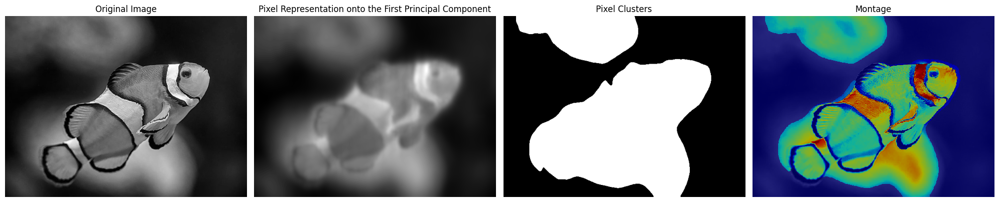

100%|██████████| 84/84 [00:00<00:00, 5653.43it/s]


Total number of filters: 84
Number of scales (sigma): 2
Number of orientations (theta): 6
Number of carriers (lambda): 7

Filter bank created in 0.016860008239746094 seconds.


100%|██████████| 84/84 [00:00<00:00, 611.93it/s]


Created 84 features for each pixel
Clustering completed in 0.9577505588531494 seconds.


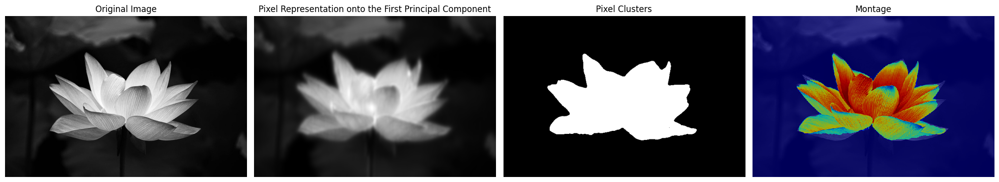

100%|██████████| 80/80 [00:00<00:00, 11427.84it/s]


Total number of filters: 80
Number of scales (sigma): 2
Number of orientations (theta): 5
Number of carriers (lambda): 8

Filter bank created in 0.01000070571899414 seconds.


100%|██████████| 80/80 [00:01<00:00, 73.74it/s]


Created 80 features for each pixel
Clustering completed in 7.131378412246704 seconds.


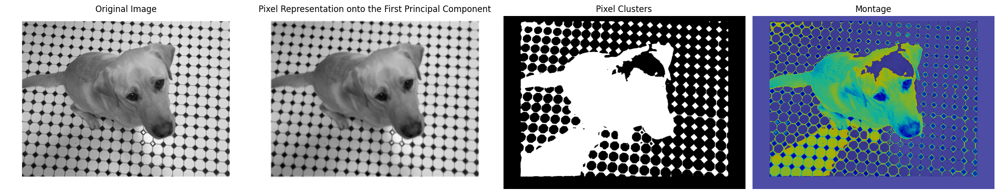

100%|██████████| 60/60 [00:00<00:00, 390.93it/s]


Total number of filters: 60
Number of scales (sigma): 2
Number of orientations (theta): 5
Number of carriers (lambda): 6

Filter bank created in 0.159470796585083 seconds.


100%|██████████| 60/60 [00:00<00:00, 801.36it/s]


Created 60 features for each pixel
Clustering completed in 0.5897817611694336 seconds.


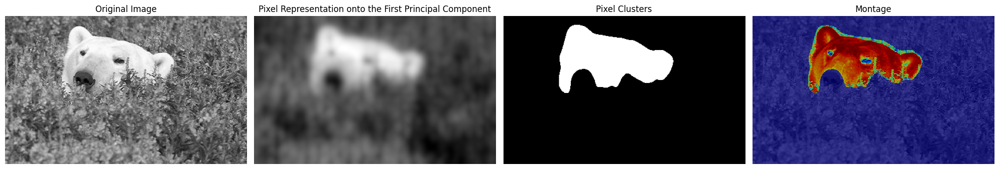

100%|██████████| 140/140 [00:00<00:00, 7239.76it/s]


Total number of filters: 140
Number of scales (sigma): 4
Number of orientations (theta): 5
Number of carriers (lambda): 7

Filter bank created in 0.022243261337280273 seconds.


100%|██████████| 140/140 [00:00<00:00, 281.21it/s]


Created 140 features for each pixel
Clustering completed in 3.487565279006958 seconds.


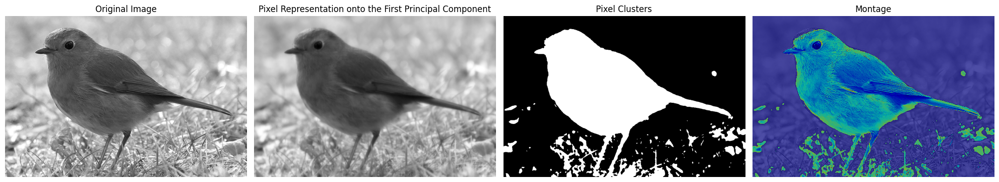

100%|██████████| 42/42 [00:00<00:00, 2334.21it/s]


Total number of filters: 42
Number of scales (sigma): 2
Number of orientations (theta): 3
Number of carriers (lambda): 7

Filter bank created in 0.02199101448059082 seconds.


100%|██████████| 42/42 [00:00<00:00, 291.55it/s]


Created 42 features for each pixel
Clustering completed in 1.3439767360687256 seconds.


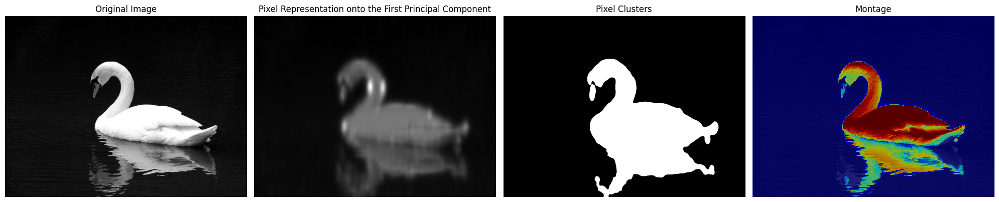

In [46]:
images_and_settings = {
    "clownfish": {
        "angles": 10,
        "sigmas": np.array([5, 9, 10]),
        "apply_smoothing": True
    },
    "flower": {
        "angles": 10,
        "sigmas": np.array([3.5, 5.0]),
        "apply_smoothing": True
    },
    "kobi": {
        "angles": 8,
        "sigmas": np.array([1.0, 2.0]),
        "apply_smoothing": True
    },
    "polar_bear_hiding": {
        "angles": 8,
        "sigmas": np.array([6.0, 10.0]),
        "apply_smoothing": True
    },
    "robin": {
        "angles": 8,
        "sigmas": np.array([1.0, 2.0, 3.0, 5.0]),
        "apply_smoothing": True
    },
    "swan": {
        "angles": 4,
        "sigmas": np.array([7, 10.0]),
        "apply_smoothing": True
    }
}

# Loop through each image, load it, and apply foreground-background separation
for image_name in images_and_settings.keys():
    # Load the image
    image = load_image(image_name)
    
    # Convert the image to grayscale
    image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

    # get delta_theta, orientations, sigmas, and apply_smoothing from the dictionary
    delta_theta = 2 * np.pi / images_and_settings[image_name]["angles"]
    orientations = np.arange(0, np.pi + delta_theta, delta_theta)
    sigmas = images_and_settings[image_name]["sigmas"]
    apply_smoothing = images_and_settings[image_name]["apply_smoothing"]
    
    # Perform foreground-background separation
    foreground_background_separation(image, sigmas, orientations, apply_smoothing)

> For each of the images, we used different sigmas and orientatian angles. I will discuss all of the choices below:<br>
> Clownfish (angles = 10, sigma = [5.0, 9.0, 10.0]): These parameters have been chosen because, there are many thin ligns on the fish, so making the sigmas too small would not capture the complete fish. Making the sigmas big captures the complete fish, altough some big background blobs are also selected. The number of angles is high, because that way it captures the fish as the forground and not the background.<br>
> Flower (angles = 10, sigma = [3.5, 5.0]): Here the sigmas are also a bit higher, because the flower itself is quite large, with large petals and less detail. Setting the sigmas lower would capture too much background noise as well. The angles is high so the veins and angles of the petals is mostly captured.<br>
> Kobi (angles = 8, sigma = [1.0, 2.0]): For this image I kept the parameters the same. Changing them either higher or lower did not make any change, or made the dog get selected as the background. With the standard parameters the dog got captured quite well, but the amount of dots in the background make it hard to capture it perfect.<br>
> Polar_bear_hiding (angles = 8, sigma = [6.0, 10.0]): Because the polar bear blends quite well with the bushed, the sigmas are set quite high so the main blob of the bear gets seperated. Using a high amount of angles, this seperation is done really well, and except for the nose, the bear is seperated good from the bushes.<br>
> robin (angles = 8, sigma = [1.0, 2.0, 3.0, 5.0]): This image contains the bird quite prominent, but the grass makes seperation quite hard. In the end, a lot of small sigmas are used to capture the bird as best as possible. 8 angles are used to capture the features good.<br>
> swan (angles = 4, sigmas = [7.0, 10.0]): This image is already quite seperated, but hard to seperate perfect because of the black parts of the swan, and the reflection. High sigmas are chosen to try to seperate most of the swan, and it worked quite well to select the complete blob. A lower amount of angles is used so really focus on the main blob.

<a id="question-36"></a>
#### <font color='#FF0000'>Question 36 (4 points)</font>

After achieving decent separation on all test images, run the script again using the corresponding parameters, but this time set `apply_smoothing = False`. 

Describe what you observe in the output when smoothing is not applied to the magnitude images. Explain why these changes occur and discuss the reasoning behind the smoothing step.

100%|██████████| 126/126 [00:00<00:00, 2249.23it/s]


Total number of filters: 126
Number of scales (sigma): 3
Number of orientations (theta): 6
Number of carriers (lambda): 7

Filter bank created in 0.05902099609375 seconds.


100%|██████████| 126/126 [00:00<00:00, 673.46it/s]


Created 126 features for each pixel
Clustering completed in 1.5724472999572754 seconds.


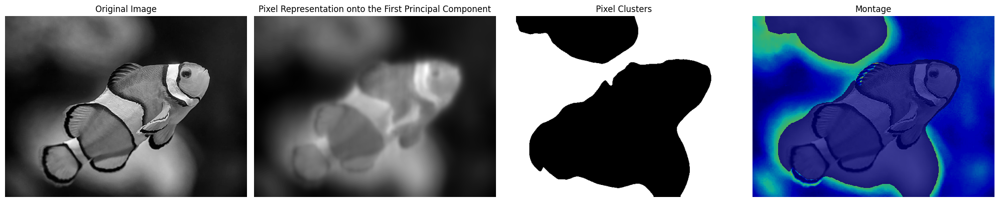

100%|██████████| 84/84 [00:00<00:00, 4603.22it/s]


Total number of filters: 84
Number of scales (sigma): 2
Number of orientations (theta): 6
Number of carriers (lambda): 7

Filter bank created in 0.02271437644958496 seconds.


100%|██████████| 84/84 [00:00<00:00, 685.10it/s]


Created 84 features for each pixel
Clustering completed in 0.9157567024230957 seconds.


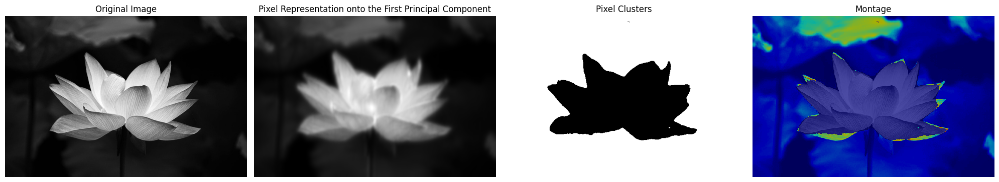

100%|██████████| 80/80 [00:00<00:00, 9979.90it/s]


Total number of filters: 80
Number of scales (sigma): 2
Number of orientations (theta): 5
Number of carriers (lambda): 8

Filter bank created in 0.011001348495483398 seconds.


100%|██████████| 80/80 [00:00<00:00, 92.89it/s]


Created 80 features for each pixel
Clustering completed in 6.82404351234436 seconds.


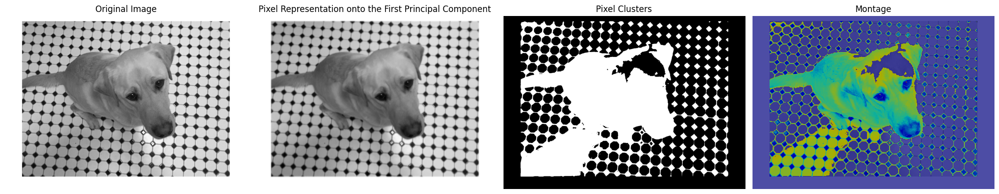

100%|██████████| 60/60 [00:00<00:00, 2725.28it/s]


Total number of filters: 60
Number of scales (sigma): 2
Number of orientations (theta): 5
Number of carriers (lambda): 6

Filter bank created in 0.024002552032470703 seconds.


100%|██████████| 60/60 [00:00<00:00, 3159.15it/s]


Created 60 features for each pixel
Clustering completed in 0.3727271556854248 seconds.


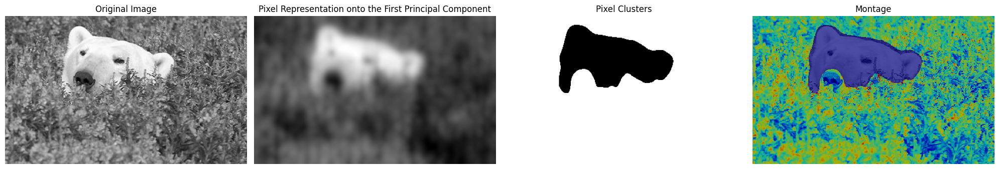

100%|██████████| 140/140 [00:00<00:00, 6667.68it/s]


Total number of filters: 140
Number of scales (sigma): 4
Number of orientations (theta): 5
Number of carriers (lambda): 7

Filter bank created in 0.02899789810180664 seconds.


100%|██████████| 140/140 [00:00<00:00, 340.67it/s]


Created 140 features for each pixel
Clustering completed in 3.094804048538208 seconds.


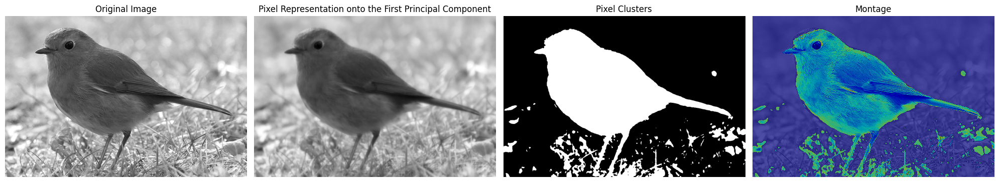

100%|██████████| 42/42 [00:00<00:00, 2111.86it/s]


Total number of filters: 42
Number of scales (sigma): 2
Number of orientations (theta): 3
Number of carriers (lambda): 7

Filter bank created in 0.021886587142944336 seconds.


100%|██████████| 42/42 [00:00<00:00, 352.71it/s]


Created 42 features for each pixel
Clustering completed in 1.2446630001068115 seconds.


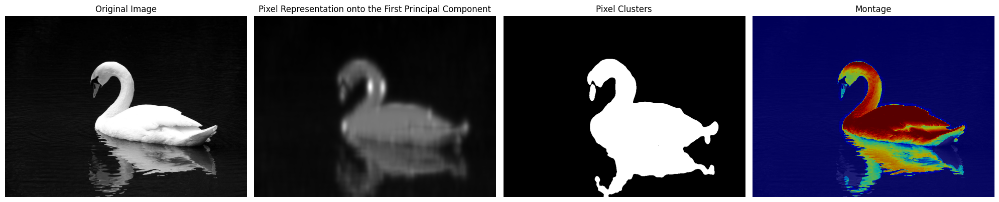

In [47]:
images_and_settings = {
    "clownfish": {
        "angles": 10,
        "sigmas": np.array([5, 9, 10]),
        "apply_smoothing": False
    },
    "flower": {
        "angles": 10,
        "sigmas": np.array([3.5, 5.0]),
        "apply_smoothing": False
    },
    "kobi": {
        "angles": 8,
        "sigmas": np.array([1.0, 2.0]),
        "apply_smoothing": False
    },
    "polar_bear_hiding": {
        "angles": 8,
        "sigmas": np.array([6.0, 10.0]),
        "apply_smoothing": False
    },
    "robin": {
        "angles": 8,
        "sigmas": np.array([1.0, 2.0, 3.0, 5.0]),
        "apply_smoothing": False
    },
    "swan": {
        "angles": 4,
        "sigmas": np.array([7, 10.0]),
        "apply_smoothing": False
    }
}

# Loop through each image, load it, and apply foreground-background separation
for image_name in images_and_settings.keys():
    # Load the image
    image = load_image(image_name)
    
    # Convert the image to grayscale
    image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

    # get delta_theta, orientations, sigmas, and apply_smoothing from the dictionary
    delta_theta = 2 * np.pi / images_and_settings[image_name]["angles"]
    orientations = np.arange(0, np.pi + delta_theta, delta_theta)
    sigmas = images_and_settings[image_name]["sigmas"]
    apply_smoothing = images_and_settings[image_name]["apply_smoothing"]
    
    # Perform foreground-background separation
    foreground_background_separation(image, sigmas, orientations, apply_smoothing)

##### <font color='yellow'>Answer:</font>

> When looking at the images, a few differences can be seen but they are quite small in these exact images. Mostly, there are some more speckles, holes and rough boundaries in the clusters and montage images when the smoothing is off. That is because the when the smoothing is turned on, a local pooling is done making it so that noise and roughness is reduced, making it so there is less within-class variance so the k-means can seperate the clusters more cleanly.

<a id="section-x"></a>
### **Section X: Individual Contribution Report *(Mandatory)***

Because we want each student to contribute fairly to the submitted work, we ask you to fill out the textcells below. Write down your contribution to each of the assignment components in percentages. Naturally, percentages for one particular component should add up to 100% (e.g. 30% - 30% - 40%). No further explanation has to be given.

| Name | Contribution on Research | Contribution on Programming | Contribution on Writing |
| -------- | ------- | ------- | ------- |
| Jonas Elzinga | 33.33333 % | 33.33333 % | 33.33333 % |
| Vlad Chibulcutean | 33.33333 % | 33.33333 % | 33.33333 % |
| May Daniel Ben Zion | 33.33333 % | 33.33333 % | 33.33333 % |
|  | - % | - % | - % |

### - End of Notebook -